# Computational Linear Algebra: PCA Homework

## Initialization:
Fill the missing values in this text box and in the following code-cell.

**Academic Year:** 2024/2025

### Team Members (Alphabetical Order):
1. Scarpino, Luciano (S346205);
2. Surname2, Name2 (StudentID2).

In [1]:
StudentID1= 346205
# StudentID2 = ...  # <-------- Fill in the missing value

## Starting Code-Cell 
### Attention: DO NOT CHANGE THE CODE INSIDE THE FOLLOWING CELL!

In [2]:
####################################################################
############## DO NOT CHANGE THE CODE IN THIS CELL #################
####################################################################

import numpy as np

var_entertainment_feat_types = ['Interests', 'Movies', 'Music']
var_personal_feat_types = ['Finance', 'Phobias']
fixed_feat_types = ['Personality', 'Health']

label_types = ['Demographic']

variables_by_type = {
    'Demographics': ['Age', 'Height', 'Weight', 'Number of siblings', 
                     'Gender', 'Hand', 'Education', 'Only child', 'Home Town Type',
                     'Home Type'],
    'Finance': ['Finances', 'Shopping centres', 'Branded clothing', 
                'Entertainment spending', 'Spending on looks', 
                'Spending on gadgets', 'Spending on healthy eating'],
    'Health': ['Smoking', 'Alcohol', 'Healthy eating'],
    'Interests': ['History', 'Psychology', 'Politics', 'Mathematics', 
                  'Physics', 'Internet', 'PC', 'Economy Management', 
                  'Biology', 'Chemistry', 'Reading', 'Geography', 
                  'Foreign languages', 'Medicine', 'Law', 'Cars', 
                  'Art exhibitions', 'Religion', 'Countryside, outdoors', 
                  'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 
                  'Active sport', 'Gardening', 'Celebrities', 'Shopping', 
                  'Science and technology', 'Theatre', 'Fun with friends', 
                  'Adrenaline sports', 'Pets'],
    'Movies': ['Movies', 'Horror', 'Thriller', 'Comedy', 'Romantic', 
               'Sci-fi', 'War', 'Fantasy/Fairy tales', 'Animated', 
               'Documentary', 'Western', 'Action'],
    'Music': ['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 
              'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 
              'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 
              'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 
              'Techno, Trance', 'Opera'],
    'Personality': ['Daily events', 'Prioritising workload', 
                    'Writing notes', 'Workaholism', 'Thinking ahead', 
                    'Final judgement', 'Reliability', 'Keeping promises', 
                    'Loss of interest', 'Friends versus money', 'Funniness', 
                    'Fake', 'Criminal damage', 'Decision making', 'Elections', 
                    'Self-criticism', 'Judgment calls', 'Hypochondria', 
                    'Empathy', 'Eating to survive', 'Giving', 
                    'Compassion to animals', 'Borrowed stuff', 
                    'Loneliness', 'Cheating in school', 'Health', 
                    'Changing the past', 'God', 'Dreams', 'Charity', 
                    'Number of friends', 'Punctuality', 'Lying', 'Waiting', 
                    'New environment', 'Mood swings', 'Appearence and gestures', 
                    'Socializing', 'Achievements', 'Responding to a serious letter', 
                    'Children', 'Assertiveness', 'Getting angry', 
                    'Knowing the right people', 'Public speaking', 
                    'Unpopularity', 'Life struggles', 'Happiness in life', 
                    'Energy levels', 'Small - big dogs', 'Personality', 
                    'Finding lost valuables', 'Getting up', 'Interests or hobbies', 
                    "Parents' advice", 'Questionnaires or polls', 'Internet usage'],
    'Phobias': ['Flying', 'Storm', 'Darkness', 'Heights', 'Spiders', 'Snakes', 
                'Rats', 'Ageing', 'Dangerous dogs', 'Fear of public speaking']
}

labels = variables_by_type['Demographics']

try:
    random_seed = min([StudentID1, StudentID2])
except NameError:
    random_seed = StudentID1

def which_featgroups():
    np.random.seed(random_seed)
    these_entertainments = np.random.choice(var_entertainment_feat_types, 2, replace=False).tolist()
    these_personal = np.random.choice(var_personal_feat_types, 1, replace=False).tolist()
    these_types = fixed_feat_types + these_personal + these_entertainments
    print('*** THESE ARE THE SELECTED TYPE OF VARIABLES:')
    for k in these_types:
        print(f'{k}')
    print('*************************************')
    return these_types

def which_features(these_types):
    np.random.seed(random_seed)
    these_features = []
    for type in these_types:
        if type != 'Personality':
            these_features += variables_by_type[type]
        else:
            these_features += np.random.choice(variables_by_type[type], 
                                               int(2 * (len(variables_by_type[type]) / 3)), 
                                               replace=False).tolist()
    print('*** THESE ARE THE SELECTED FEATURES:')
    for ft in these_features:
        print(f'{ft}')
    print('*************************************')
    return these_features

these_types = which_featgroups()
these_features = which_features(these_types)

np.random.seed(random_seed)

*** THESE ARE THE SELECTED TYPE OF VARIABLES:
Personality
Health
Finance
Interests
Music
*************************************
*** THESE ARE THE SELECTED FEATURES:
Elections
Lying
Compassion to animals
Criminal damage
Responding to a serious letter
Children
Daily events
Socializing
Number of friends
Empathy
Punctuality
Knowing the right people
Public speaking
Achievements
Giving
Hypochondria
God
Thinking ahead
New environment
Unpopularity
Funniness
Writing notes
Dreams
Reliability
Happiness in life
Keeping promises
Life struggles
Loss of interest
Mood swings
Judgment calls
Internet usage
Getting up
Prioritising workload
Cheating in school
Questionnaires or polls
Assertiveness
Workaholism
Borrowed stuff
Smoking
Alcohol
Healthy eating
Finances
Shopping centres
Branded clothing
Entertainment spending
Spending on looks
Spending on gadgets
Spending on healthy eating
History
Psychology
Politics
Mathematics
Physics
Internet
PC
Economy Management
Biology
Chemistry
Reading
Geography
Foreign lan

## Importing Modules

In the following cell, import all the modules you think are necessary for doing the homework, **among the ones listed and used during the laboratories of the course**.
No extra modules are allowed for reproducibility.

In [3]:
# DO NOT IMPORT NUMPY
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import LabelEncoder
import random
from IPython.display import display
from matplotlib.lines import Line2D
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colormaps
import ipympl
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.patches as mpatches
%matplotlib widget
pd.options.display.max_columns= 155

## Exercise 1. Preparing the Dataset

In the cells below, do the following operations:
1. load the dataset "_responses_hw.csv_";
2. create a working dataframe extracting from _responses_hw.csv_ the columns corresponding to the variables in _these_features_, and randomly selecting 2/3 of the rows. Let us call this dataframe _X_df_;
3. analyze the obtained dataframe and performing cleansing/encoding operations.

In [4]:
dataset= pd.read_csv('responses_hw.csv', encoding= 'utf-8').copy()
if dataset.isnull().values.any():
    dataset.dropna(inplace= True)

n_rows= dataset.shape[0]
row_indexes_train= []
random.seed(random_seed)                                         #Set random seed for replicity of algorithm
for i in range (int(2/3*n_rows//1)):                             #2/3 of 674 rows
    rows_index= random.randint(0,n_rows-1)
    row_indexes_train.append(rows_index)

mydataset= dataset[these_features]
X_df= mydataset.iloc[row_indexes_train]
labels_train= dataset[labels].iloc[row_indexes_train]

categorical_ordered= ['Smoking','Alcohol','Punctuality','Lying','Internet usage']       #we can use a label encoder because we have a order
label_encoder= LabelEncoder()
for i in categorical_ordered:
    X_df[i]= label_encoder.fit_transform(X_df[i])

display(X_df)
display(X_df.describe())
display(X_df.info())
display(labels_train)
display(labels_train.describe())
display(labels_train.info())


/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/305217496.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_df[i]= label_encoder.fit_transform(X_df[i])
/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/305217496.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_df[i]= label_encoder.fit_transform(X_df[i])
/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/305217496.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

,Elections,Lying,Compassion to animals,Criminal damage,Responding to a serious letter,Children,Daily events,Socializing,Number of friends,Empathy,Punctuality,Knowing the right people,Public speaking,Achievements,Giving,Hypochondria,God,Thinking ahead,New environment,Unpopularity,Funniness,Writing notes,Dreams,Reliability,Happiness in life,Keeping promises,Life struggles,Loss of interest,Mood swings,Judgment calls,Internet usage,Getting up,Prioritising workload,Cheating in school,Questionnaires or polls,Assertiveness,Workaholism,Borrowed stuff,Smoking,Alcohol,Healthy eating,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
155,3.0,0,5.0,5.0,4.0,4.0,4.0,5.0,1,5.0,2,5.0,5.0,1.0,5.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,2,5.0,2.0,5.0,3.0,5.0,5.0,5.0,0,5.0,5.0,2.0,5.0,4.0,5.0,5.0,3,2,3.0,5.0,5.0,3.0,3.0,5.0,4,3.0,4.0,5.0,2.0,3.0,2.0,3.0,2.0,1.0,4.0,3.0,4.0,3.0,5.0,4.0,5.0,2.0,3.0,1.0,3.0,4.0,5.0,4.0,3.0,3.0,3.0,2.0,3.0,4.0,3.0,3.0,4.0,4.0,5.0,4.0,4.0,3.0,3.0,5.0,2.0,3.0,3.0,2.0,3.0,3.0,2.0,4.0,3.0,4.0,2.0,2.0,3.0
610,5.0,3,5.0,4.0,4.0,2.0,5.0,2.0,3,4.0,1,2.0,4.0,3.0,2.0,1.0,2.0,3.0,2.0,4.0,4.0,2.0,3,2.0,2.0,4.0,1.0,4.0,3.0,4.0,0,5.0,2.0,4.0,3.0,3.0,2.0,4.0,0,2,2.0,3.0,3.0,2.0,3.0,2.0,2,2.0,2.0,2.0,3.0,2.0,2.0,5.0,5.0,2.0,5.0,5.0,2.0,1.0,5.0,5.0,1.0,2.0,1.0,1.0,1.0,1.0,4.0,1.0,2.0,3.0,1.0,4.0,2.0,4.0,1.0,5.0,1.0,1.0,5.0,4.0,3.0,2.0,2.0,3.0,2.0,4.0,5.0,4.0,2.0,2.0,2.0,4.0,5.0,4.0,2.0,3.0,2.0
539,5.0,0,5.0,5.0,3.0,5.0,5.0,3.0,1,4.0,2,4.0,2.0,3.0,2.0,3.0,4.0,5.0,2.0,2.0,3.0,3.0,2,5.0,4.0,4.0,1.0,4.0,3.0,5.0,2,2.0,1.0,3.0,2.0,5.0,3.0,4.0,0,2,3.0,1.0,4.0,4.0,4.0,3.0,3,3.0,5.0,4.0,5.0,1.0,5.0,5.0,5.0,2.0,4.0,4.0,2.0,4.0,4.0,5.0,5.0,3.0,4.0,2.0,1.0,1.0,5.0,4.0,3.0,4.0,2.0,3.0,5.0,5.0,4.0,3.0,4.0,1.0,5.0,3.0,3.0,2.0,2.0,5.0,1.0,4.0,5.0,4.0,1.0,1.0,1.0,1.0,3.0,4.0,1.0,1.0,4.0
639,1.0,3,4.0,3.0,3.0,2.0,1.0,2.0,2,4.0,0,3.0,5.0,3.0,2.0,2.0,1.0,3.0,3.0,3.0,4.0,3.0,3,3.0,2.0,3.0,4.0,3.0,4.0,3.0,0,3.0,3.0,3.0,1.0,3.0,3.0,4.0,2,2,3.0,3.0,3.0,2.0,3.0,2.0,4,3.0,2.0,1.0,1.0,3.0,1.0,5.0,5.0,1.0,2.0,1.0,5.0,2.0,4.0,2.0,1.0,4.0,1.0,1.0,4.0,1.0,5.0,1.0,2.0,4.0,1.0,1.0,1.0,4.0,1.0,2.0,2.0,1.0,5.0,3.0,2.0,1.0,2.0,1.0,1.0,1.0,5.0,5.0,3.0,1.0,2.0,5.0,5.0,5.0,1.0,1.0,1.0
336,1.0,3,1.0,3.0,3.0,2.0,3.0,1.0,3,2.0,2,2.0,5.0,3.0,1.0,1.0,4.0,3.0,3.0,3.0,3.0,4.0,3,5.0,4.0,4.0,2.0,1.0,3.0,4.0,0,5.0,3.0,5.0,4.0,3.0,5.0,5.0,2,1,3.0,5.0,2.0,3.0,1.0,1.0,2,1.0,1.0,1.0,3.0,5.0,5.0,3.0,4.0,1.0,3.0,5.0,1.0,3.0,3.0,4.0,1.0,2.0,1.0,1.0,4.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,5.0,1.0,4.0,1.0,4.0,5.0,4.0,3.0,1.0,2.0,3.0,2.0,5.0,3.0,1.0,2.0,3.0,3.0,3.0,2.0,3.0,1.0,4.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,5.0,3,4.0,4.0,3.0,3.0,4.0,3.0,3,4.0,2,4.0,5.0,3.0,4.0,1.0,2.0,4.0,3.0,4.0,4.0,2.0,3,4.0,4.0,4.0,4.0,2.0,4.0,4.0,0,3.0,2.0,5.0,3.0,4.0,4.0,5.0,3,1,3.0,4.0,4.0,4.0,5.0,4.0,4,5.0,5.0,2.0,5.0,3.0,4.0,5.0,4.0,2.0,4.0,2.0,4.0,5.0,2.0,2.0,3.0,5.0,4.0,3.0,5.0,2.0,2.0,2.0,5.0,5.0,5.0,4.0,4.0,5.0,3.0,5.0,3.0,5.0,5.0,4.0,4.0,2.0,1.0,4.0,4.0,3.0,2.0,1.0,1.0,4.0,2.0,3.0,2.0,4.0,4.0,5.0,3.0
561,5.0,2,5.0,4.0,

,Elections,Lying,Compassion to animals,Criminal damage,Responding to a serious letter,Children,Daily events,Socializing,Number of friends,Empathy,Punctuality,Knowing the right people,Public speaking,Achievements,Giving,Hypochondria,God,Thinking ahead,New environment,Unpopularity,Funniness,Writing notes,Dreams,Reliability,Happiness in life,Keeping promises,Life struggles,Loss of interest,Mood swings,Judgment calls,Internet usage,Getting up,Prioritising workload,Cheating in school,Questionnaires or polls,Assertiveness,Workaholism,Borrowed stuff,Smoking,Alcohol,Healthy eating,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
count,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000,449.000000
mean,3.387528,2.249443,4.073497,2.636971,3.008909,3.543430,3.113586,3.184855,3.325167,3.873051,1.066815,3.536748,3.374165,2.977728,2.906459,1.832962,3.113586,3.360802,3.614699,3.458797,3.325167,3.057906,3.296214,3.868597,3.750557,4.046771,3.028953,2.645880,3.236080,3.988864,0.327394,3.538976,2.670379,3.763920,2.712695,3.530067,2.959911,4.064588,1.908686,1.454343,2.966592,3.089087,3.200445,3.109131,3.211581,2.995546,2.913140,3.545657,3.229399,3.120267,2.610245,2.503341,2.271715,4.240535,3.220490,2.599109,2.679287,2.200445,3.064588,3.131403,3.739421,2.525612,2.216036,2.779510,2.570156,2.207127,3.570156,2.518931,2.342984,1.835189,3.436526,3.276169,1.861915,2.369710,3.155902,3.365256,3.097996,4.576837,3.031180,3.467706,4.728285,3.271715,3.060134,2.236080,2.106904,3.017817,2.759465,3.436526,3.761693,2.371938,2.334076,2.797327,2.772829,2.728285,3.151448,2.848552,2.873051,2.282851,2.191537
std,1.628821,0.993351,1.094400,1.558263,1.204497,1.192801,1.131141,1.095503,1.088214,1.196875,0.855648,1.145297,1.332241,0.920716,1.364466,1.112502,1.540529,1.111577,1.075647,1.183487,1.126512,1.427171,0.690502,0.917644,0.850502,0.893950,1.340162,1.296195,1.016576,0.973928,0.635401,1.319131,1.242132,1.198004,1.147530,1.070968,1.242188,0.990048,1.137094,0.822825,0.975708,1.203081,1.281705,1.253257,1.207214,1.153402,1.247866,1.036514,1.265416,1.258458,1.304861,1.390533,1.345338,0.881383,1.315406,1.380540,1.406155,1.423621,1.497861,1.267068,1.148089,1.387086,1.255385,1.427701,1.292181,1.336087,1.274790,1.463918,1.540510,1.260495,1.451939,1.504276,1.113471,1.225317,1.284425,1.257210,1.346033,0.743422,1.466564,1.514647,0.65269

<class 'pandas.core.frame.DataFrame'>
Index: 449 entries, 155 to 719
Data columns (total 99 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Elections                       449 non-null    float64
 1   Lying                           449 non-null    int64  
 2   Compassion to animals           449 non-null    float64
 3   Criminal damage                 449 non-null    float64
 4   Responding to a serious letter  449 non-null    float64
 5   Children                        449 non-null    float64
 6   Daily events                    449 non-null    float64
 7   Socializing                     449 non-null    float64
 8   Number of friends               449 non-null    int64  
 9   Empathy                         449 non-null    float64
 10  Punctuality                     449 non-null    int64  
 11  Knowing the right people        449 non-null    float64
 12  Public speaking                 449 non

None

,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
155,19.0,171.0,72.0,1.0,female,right,secondary school,no,city,block of flats
610,20.0,183.0,83.0,1.0,male,right,secondary school,no,city,house/bungalow
539,26.0,194.0,85.0,2.0,male,right,college/bachelor degree,no,city,block of flats
639,18.0,178.0,70.0,1.0,male,right,primary school,no,city,block of flats
336,17.0,170.0,60.0,1.0,male,left,secondary school,no,city,block of flats
...,...,...,...,...,...,...,...,...,...,...
645,23.0,179.0,77.0,1.0,male,right,secondary school,yes,village,house/bungalow
561,20.0,185.0,86.0,1.0,male,right,secondary school,no,city,block of flats
311,18.0,167.0,57.0,0.0,female,right,college/bachelor degree,yes,city,block of flats
662,21.0,162.0,52.0,1.0,female,right,secondary school,no,city,house/bungalow


,Age,Height,Weight,Number of siblings
count,449.000000,449.000000,449.000000,449.000000
mean,20.256125,174.004454,66.968820,1.329621
std,2.750627,9.924041,13.708994,1.003583
min,15.000000,152.000000,42.000000,0.000000
25%,19.000000,167.000000,56.000000,1.000000
50%,20.000000,173.000000,64.000000,1.000000
75%,21.000000,182.000000,76.000000,2.000000
max,30.000000,203.000000,150.000000,10.000000


<class 'pandas.core.frame.DataFrame'>
Index: 449 entries, 155 to 719
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 449 non-null    float64
 1   Height              449 non-null    float64
 2   Weight              449 non-null    float64
 3   Number of siblings  449 non-null    float64
 4   Gender              449 non-null    object 
 5   Hand                449 non-null    object 
 6   Education           449 non-null    object 
 7   Only child          449 non-null    object 
 8   Home Town Type      449 non-null    object 
 9   Home Type           449 non-null    object 
dtypes: float64(4), object(6)
memory usage: 38.6+ KB


None

During the data acquisition and preprocessing phase, it is crucial to address issues that may affect the performance of PCA and k-Means. After saving the data as a Pandas DataFrame, which is among the best tools for handling large datasets. The presence of missing values in the dataset could be fixed using the .ffill() method, so missing values are filled with the preceding value within the same column. This choice would not significantly impact the overall data evaluation, as the dataset contains a much higher proportion of available values compared to the missing ones. However, since task in this project is to clustering values, it is better to remove the entire row which contains the missin value: the concept is that is a clustering problem is better to have a lower amount of data but better in precision.

Also, i splitted data in 2/3 for training, but since We are talking about clustering, it is not given that a test set will be usefull.

The second major challenge involves managing categorical features. Given a detailed description of all responses provided to specific questions (each corresponding to a column in the DataFrame), I manually identified attributes with categorical values. These attributes fall into two main categories:

- Ordered: Responses belong to a scale of plausible answers.
- Unordered: Responses do not have an inherent ranking, often belong to "Demographic" attribute. We can understand that this are the labels values, so they will not be include in the X values for PCA.

For the first category, I employed a Label Encoder provided by Scikit-learn.
Finally, I set a random seed to ensure reproducibility of simulations, allowing for consistent extraction of the same random rows from the original dataset across different trials.

Some considerations about dataset: data are already distribiuted in a range of values that goes from 1 to 5 but it is possible to observe that some kind of feature (i.e. categorical feature that has been encoded) are based on a smaller range that goes from 0 to 3 and this could be a problem later. So it is possible to consider some issues in application of min-max scaler.

## Exercise 2. Analyzing the Variance and the PCs

In the cells below, do the following operations:
1. create two new dataframes from _X_df_ applying a StandardScaler and a MinMaxscaler. Call these new dataframes as _Xstd_df_ and _Xmm_df_, respectively;
2. compute the variance of all the features in _X_df_, _Xstd_df_, and _Xmm_df_ and **comment the results**;
3. compute all the $n$ Principal Components (PCs) for each dataset _X_df_, _Xstd_df_, and _Xmm_df_. Then, visualize the curves of the cumulative explained variances and **comment the results**.

In [5]:
Stand_Scaler= StandardScaler()
Stand_Scaler.fit(X_df)
Xstd_df= pd.DataFrame(Stand_Scaler.transform(X_df),columns= X_df.columns)
print('-'*20,'Standard Scaled dataset','-'*20)
display(Xstd_df)

Min_Max_Scaler= MinMaxScaler(feature_range=(1,5))
Min_Max_Scaler.fit(X_df)
Xmm_df= pd.DataFrame(Min_Max_Scaler.transform(X_df),columns= X_df.columns)
print('-'*20,'Min-Max Scaled dataset','-'*20)
display(Xmm_df)
print('-'*65)

-------------------- Standard Scaled dataset --------------------


,Elections,Lying,Compassion to animals,Criminal damage,Responding to a serious letter,Children,Daily events,Socializing,Number of friends,Empathy,Punctuality,Knowing the right people,Public speaking,Achievements,Giving,Hypochondria,God,Thinking ahead,New environment,Unpopularity,Funniness,Writing notes,Dreams,Reliability,Happiness in life,Keeping promises,Life struggles,Loss of interest,Mood swings,Judgment calls,Internet usage,Getting up,Prioritising workload,Cheating in school,Questionnaires or polls,Assertiveness,Workaholism,Borrowed stuff,Smoking,Alcohol,Healthy eating,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
0,-0.238185,-2.267026,0.847530,1.518142,0.823744,0.383198,0.784520,1.658753,-2.139066,0.942627,1.091835,1.279043,1.221737,-2.150430,1.536042,2.849945,-1.373517,1.476305,-2.433528,-0.388098,-2.066343,1.362317,-1.879298,1.234319,-2.060559,1.067501,-0.021628,1.818203,1.737093,1.039362,-0.515831,1.108801,1.877594,-1.474025,1.995465,0.439282,1.644167,0.945869,0.960810,0.663891,0.034277,1.590122,1.405598,-0.087175,-0.175460,1.739801,0.871946,-0.527022,0.609650,1.495345,-0.468192,0.357570,-0.202193,-1.409057,-0.928878,-1.159613,0.940285,0.562261,0.625195,-0.103822,1.099205,1.064124,2.220091,-0.546599,0.333021,-0.904487,-0.447754,1.012844,1.726688,1.719344,-0.300985,-0.183794,1.023245,-0.302063,-0.121514,0.505446,-0.072884,-2.123418,0.661342,0.351823,0.416764,0.930842,0.772068,0.685888,0.840569,1.537938,-0.576946,-0.377483,-0.620080,-0.256663,0.523017,0.145720,-0.618586,0.976929,-0.123455,0.859568,-0.648506,-0.214454,0.660094
1,0.991067,0.756423,0.847530,0.875686,0.823744,-1.295397,1.669569,-1.082769,-0.299141,0.106185,-0.078174,-1.343287,0.470285,0.024217,-0.665074,-0.749564,-0.723666,-0.324948,-1.502817,0.457805,0.599714,-0.742088,-0.429461,-2.038571,-2.060559,-0.052377,-1.515650,1.045854,-0.232490,0.011447,-0.515831,1.108801,-0.540302,0.197281,0.250648,-0.495494,-0.773620,-0.065310,-1.680437,0.663891,-0.991762,-0.074132,-0.156564,-0.885986,-0.175460,-0.864101,-0.732577,-1.492870,-0.972621,-0.891183,0.299028,-0.362381,-0.202193,0.862636,1.354331,-0.434451,1.652237,1.968697,-0.711532,-1.684029,1.099205,1.785864,-0.969736,-0.546599,-1.216476,-0.904487,-2.018390,-1.038737,1.076828,-0.663327,-0.990488,-0.183794,-0.774943,1.331988,-0.900941,0.505446,-1.560390,0.569844,-1.386537,-1.631046,0.416764,0.930842,-0.049398,-0.211965,-0.100617,-0.013824,-0.576946,0.487262,1.008084,1.123478,-0.262383,-0.573272,-0.618586,0.976929,1.506876,0.859568,-0.648506,0.543733,-0.156386
2,0.991067,-2.267026,0.847530,1.518142,-0.007404,1.222496,1.669569,-0.168928,-2.139066,0.106185,1.091835,0.404933,-1.032619,0.024217,-0.665074,1.050191,0.576038,1.476305,-1.502817,-1.234001,-0.288971,-0.040620,-1.879298,1.234319,0.293617,-0.052377,-1.515650,1.045854,-0.232490,1.039362,2.635299,-1.167960,-1.346267,-0.638372,-0.621761,1.374058,0.032309,-0.065310,-1.680437,0.663891,0.034277,-1.738385,0.624517,0.711636,0.653818,0.003866,0.069684,-0.527022,1.400786,0.699836,1.833468,-1.082331,2.030217,0.862636,1.354331,-0.434451,0.940285,1.265479,-0.711532,0.686282,0.227221,1.785864,2.220091,0.154609,1.107770,-0.155198,-2.018390,-1.038737,1.726688,1.719344,-0.300985,0.481719,0.124151,0.514963,1.437340,1.301746,0.670868,-2.123418,0.661342,-1.631046,0.416764,-0.347287,-0.049398,-0.211965,-0.100617,1.537938,-1.336620,0.487262,1.008

-------------------- Min-Max Scaled dataset --------------------


,Elections,Lying,Compassion to animals,Criminal damage,Responding to a serious letter,Children,Daily events,Socializing,Number of friends,Empathy,Punctuality,Knowing the right people,Public speaking,Achievements,Giving,Hypochondria,God,Thinking ahead,New environment,Unpopularity,Funniness,Writing notes,Dreams,Reliability,Happiness in life,Keeping promises,Life struggles,Loss of interest,Mood swings,Judgment calls,Internet usage,Getting up,Prioritising workload,Cheating in school,Questionnaires or polls,Assertiveness,Workaholism,Borrowed stuff,Smoking,Alcohol,Healthy eating,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
0,3.0,1.000000,5.0,5.0,4.0,4.0,4.0,5.0,1.0,5.0,5.0,5.0,5.0,1.0,5.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,2.0,5.0,2.0,5.0,3.0,5.0,5.0,5.0,1.0,5.0,5.0,2.0,5.0,4.0,5.0,5.0,5.000000,5.0,3.0,5.0,5.0,3.0,3.0,5.0,4.0,3.0,4.0,5.0,2.0,3.0,2.0,3.0,2.0,1.0,4.0,3.0,4.0,3.0,5.0,4.0,5.0,2.0,3.0,1.0,3.0,4.0,5.0,4.0,3.0,3.0,3.0,2.0,3.0,4.0,3.0,2.333333,4.0,4.0,5.0,4.0,4.0,3.0,3.0,5.0,2.0,3.0,3.0,2.0,3.0,3.0,2.0,4.0,3.0,4.0,2.0,2.0,3.0
1,5.0,5.000000,5.0,4.0,4.0,2.0,5.0,2.0,3.0,4.0,3.0,2.0,4.0,3.0,2.0,1.0,2.0,3.0,2.0,4.0,4.0,2.0,3.0,2.0,2.0,4.0,1.0,4.0,3.0,4.0,1.0,5.0,2.0,4.0,3.0,3.0,2.0,4.0,1.000000,5.0,2.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,5.0,5.0,2.0,5.0,5.0,2.0,1.0,5.0,5.0,1.0,2.0,1.0,1.0,1.0,1.0,4.0,1.0,2.0,3.0,1.0,4.0,2.0,4.0,1.0,5.000000,1.0,1.0,5.0,4.0,3.0,2.0,2.0,3.0,2.0,4.0,5.0,4.0,2.0,2.0,2.0,4.0,5.0,4.0,2.0,3.0,2.0
2,5.0,1.000000,5.0,5.0,3.0,5.0,5.0,3.0,1.0,4.0,5.0,4.0,2.0,3.0,2.0,3.0,4.0,5.0,2.0,2.0,3.0,3.0,2.0,5.0,4.0,4.0,1.0,4.0,3.0,5.0,5.0,2.0,1.0,3.0,2.0,5.0,3.0,4.0,1.000000,5.0,3.0,1.0,4.0,4.0,4.0,3.0,3.0,3.0,5.0,4.0,5.0,1.0,5.0,5.0,5.0,2.0,4.0,4.0,2.0,4.0,4.0,5.0,5.0,3.0,4.0,2.0,1.0,1.0,5.0,4.0,3.0,4.0,2.0,3.0,5.0,5.0,4.0,2.333333,4.0,1.0,5.0,3.0,3.0,2.0,2.0,5.0,1.0,4.0,5.0,4.0,1.0,1.0,1.0,1.0,3.0,4.0,1.0,1.0,4.0
3,1.0,5.000000,4.0,3.0,3.0,2.0,1.0,2.0,2.0,4.0,1.0,3.0,5.0,3.0,2.0,2.0,1.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,2.0,3.0,4.0,3.0,4.0,3.0,1.0,3.0,3.0,3.0,1.0,3.0,3.0,4.0,3.666667,5.0,3.0,3.0,3.0,2.0,3.0,2.0,4.0,3.0,2.0,1.0,1.0,3.0,1.0,5.0,5.0,1.0,2.0,1.0,5.0,2.0,4.0,2.0,1.0,4.0,1.0,1.0,4.0,1.0,5.0,1.0,2.0,4.0,1.0,1.0,1.0,4.0,1.0,1.000000,2.0,1.0,5.0,3.0,2.0,1.0,2.0,1.0,1.0,1.0,5.0,5.0,3.0,1.0,2.0,5.0,5.0,5.0,1.0,1.0,1.0
4,1.0,5.000000,1.0,3.0,3.0,2.0,3.0,1.0,3.0,2.0,5.0,2.0,5.0,3.0,1.0,1.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,5.0,4.0,4.0,2.0,1.0,3.0,4.0,1.0,5.0,3.0,5.0,4.0,3.0,5.0,5.0,3.666667,3.0,3.0,5.0,2.0,3.0,1.0,1.0,2.0,1.0,1.0,1.0,3.0,5.0,5.0,3.0,4.0,1.0,3.0,5.0,1.0,3.0,3.0,4.0,1.0,2.0,1.0,1.0,4.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,5.0,1.0,3.666667,1.0,4.0,5.0,4.0,3.0,1.0,2.0,3.0,2.0,5.0,3.0,1.0,2.0,3.0,3.0,3.0,2.0,3.0,1.0,4.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,5.0,5.000000,4.0,4.0,3.0,3.0,4.0,3.0,3.0,4.0,5.0,4.0,5.0,3.0,4.0,1.0,2.0,4.0,3.0,4.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,1.0,3.0,2.0,5.0,3.0,4.0,4.0,5.0,5.000000,3.0,3.0,4.0,4.0,4.0,5.0,4.0,4.0,5.0,5.0,2.0,5.0,3.0,4.0,5.0,4.0,2.0,4.0,2.0,4.0,5.0,2.0

-----------------------------------------------------------------


In [6]:
#Variance of features in no standardazed dataset#

variance_values= []

xdf_variances= []
for i in X_df.columns:
    xdf_variances.append(np.var(X_df[i]))
variance_values.append(xdf_variances)

xstd_variances= []
for i in Xstd_df.columns:
    xstd_variances.append(np.var(Xstd_df[i]))
variance_values.append(xstd_variances)

xmm_variances=[]
for i in Xmm_df.columns:
    xmm_variances.append(np.var(Xmm_df[i]))
variance_values.append(xmm_variances)

variances= pd.DataFrame(variance_values, index= ['Xdf','Xstd','Xmm'],columns= X_df.columns)
print('-'*20,'variance of each feature in each case','-'*20)
display(variances)
print('-'*65)
display(variances.describe())

-------------------- variance of each feature in each case --------------------


,Elections,Lying,Compassion to animals,Criminal damage,Responding to a serious letter,Children,Daily events,Socializing,Number of friends,Empathy,Punctuality,Knowing the right people,Public speaking,Achievements,Giving,Hypochondria,God,Thinking ahead,New environment,Unpopularity,Funniness,Writing notes,Dreams,Reliability,Happiness in life,Keeping promises,Life struggles,Loss of interest,Mood swings,Judgment calls,Internet usage,Getting up,Prioritising workload,Cheating in school,Questionnaires or polls,Assertiveness,Workaholism,Borrowed stuff,Smoking,Alcohol,Healthy eating,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
Xdf,2.64715,0.984549,1.195044,2.422776,1.447582,1.419606,1.276631,1.197454,1.181572,1.429318,0.730502,1.308783,1.770914,0.845829,1.85762,1.234905,2.367945,1.232851,1.154439,1.397523,1.266204,2.032282,0.475732,0.840194,0.721742,0.797367,1.792035,1.676381,1.031126,0.946424,0.402835,1.736231,1.539457,1.432017,1.313892,1.144419,1.539596,0.978011,1.290103,0.675532,0.949886,1.444179,1.639109,1.567155,1.45412,1.327374,1.553703,1.071969,1.59771,1.580191,1.698871,1.929276,1.805904,0.775105,1.72644,1.901647,1.972867,2.022182,2.23859,1.601887,1.315172,1.919723,1.572482,2.03379,1.666014,1.781152,1.62147,2.138283,2.367885,1.58531,2.103432,2.257806,1.237057,1.498058,1.646073,1.577056,1.807769,0.551446,2.146021,2.289046,0.425057,0.61214,1.481907,1.24048,1.128883,1.661152,1.732789,1.337285,1.508911,2.09997,1.621133,1.934425,1.560865,1.694545,1.504903,1.794436,1.812392,1.739595,1.500062
Xstd,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Xmm,2.64715,1.750309,1.195044,2.422776,1.447582,1.419606,1.276631,1.197454,1.181572,1.429318,2.922009,1.308783,1.770914,0.845829,1.85762,1.234905,2.367945,1.232851,1.154439,1.397523,1.266204,2.032282,0.475732,0.840194,0.721742,0.797367,1.792035,1.676381,1.031126,0.946424,1.611341,1.736231,1.539457,1.432017,1.313892,1.144419,1.539596,0.978011,2.293516,2.702129,0.949886,1.444179,1.639109,1.567155,1.45412,1.327374,1.553703,1.071969,1.59771,1.580191,1.698871,1.929276,1.805904,0.775105,1.72644,1.901647,1.972867,2.022182,2.23859,1.601887,1.315172,1.919723,1.572482,2.03379,1.666014,1.781152,1.62147,2.138283,2.367885,1.58531,2.103432,2.257806,1.237057,1.498058,1.646073,1.577056,1.807769,0.980348,2.146021,2.289046,0.425057,0.61214,1.481907,1.24048,1.128883,1.661152,1.732789,1.337285,1.508911,2.09997,1.621133,1.934425,1.560865,1.694545,1.504903,1.794436,1.812392,1.739595,1.500062


-----------------------------------------------------------------


,Elections,Lying,Compassion to animals,Criminal damage,Responding to a serious letter,Children,Daily events,Socializing,Number of friends,Empathy,Punctuality,Knowing the right people,Public speaking,Achievements,Giving,Hypochondria,God,Thinking ahead,New environment,Unpopularity,Funniness,Writing notes,Dreams,Reliability,Happiness in life,Keeping promises,Life struggles,Loss of interest,Mood swings,Judgment calls,Internet usage,Getting up,Prioritising workload,Cheating in school,Questionnaires or polls,Assertiveness,Workaholism,Borrowed stuff,Smoking,Alcohol,Healthy eating,Finances,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,Reading,Geography,Foreign languages,Medicine,Law,Cars,Art exhibitions,Religion,"Countryside, outdoors",Dancing,Musical instruments,Writing,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
mean,2.098100,1.244952,1.130029,1.948517,1.298388,1.279737,1.184420,1.131636,1.121048,1.286212,1.550837,1.205855,1.513943,0.897219,1.571747,1.156603,1.911963,1.155234,1.102959,1.265015,1.177469,1.688188,0.650488,0.893463,0.814495,0.864911,1.528023,1.450920,1.020751,0.964283,1.004726,1.490821,1.359638,1.288011,1.209262,1.096279,1.359730,0.985341,1.527873,1.459221,0.966591,1.296120,1.426073,1.378103,1.302747,1.218250,1.369135,1.047979,1.398474,1.386794,1.465914,1.619517,1.537269,0.850070,1.484293,1.601098,1.648578,1.681455,1.825727,1.401258,1.210115,1.613148,1.381655,1.689193,1.444009,1.520768,1.414313,1.758855,1.911923,1.390206,1.735621,1.838538,1.158038,1.332039,1.430715,1.384704,1.538513,0.843931,1.764014,1.859364,0.616705,0.741427,1.321272,1.160320,1.085922,1.440768,1.488526,1.224857,1.339274,1.733313,1.414089,1.622950,1.373910,1.463030,1.336602,1.529624,1.541595,1.493063,1.333375
std,0.950982,0.437720,0.112609,0.821440,0.258412,0.242260,0.159713,0.114000,0.104830,0.247867,1.195091,0.178276,0.445087,0.089011,0.495147,0.135622,0.789783,0.134437,0.089165,0.229510,0.153693,0.595988,0.302686,0.092264,0.160652,0.116990,0.457281,0.390509,0.017971,0.030932,0.604267,0.425063,0.311455,0.249425,0.181226,0.083380,0.311536,0.012695,0.678747,1.088548,0.028933,0.256447,0.368990,0.327447,0.262186,0.189010,0.319680,0.041551,0.345088,0.334973,0.403493,0.536518,0.465289,0.129843,0.419410,0.520566,0.561685,0.590157,0.715100,0.347500,0.181965,0.531002,0.330523,0.596859,0.384523,0.450998,0.358806,0.657188,0.789749,0.337929,0.637067,0.726195,0.136865,0.287554,0.373011,0.333163,0.466366,0.253490,0.661656,0.744231,0.331943,0.223931,0.278229,0.138841,0.074411,0.381717,0.423076,0.194732,0.293820,0.635068,0.358611,0.539490,0.323816,0.400996,0.291506,0.458668,0.469035,0.427005,0.288711
min,1.000000,0.984549,1.000000,1.0

By definition, the results obtained are as follows:

- Standard Scaler: Standardizing the data shifts and centers it around the mean (making the mean equal to 0) and normalizes the standard deviation. In fact, you can see that the variance of all features is equal to 1. Standardizing data using the standard scaler is particularly useful when the data have several ranges of values, but that’s clearly not the case here.

- Min-Max Scaler: The Min-Max scaler scales the data to fit within a fixed range. Since the data are already within a range of 1 to 5, using this range makes the most sense. You can see that, for many features, the variance doesn’t match the original data. In cases where the variance differs (i.e. in encoded data from categorical), it is reasonable to think that the data originally fell within a narrower subrange.Indeed, if We make a check on the original dataset (without scaling) it is possible to observe that categorical data that were econded, fell in a sub range of (0,3), as said before. When the Min-Max scaler is applied, the data are spread evenly across the range of 1 to 5, which changes the distribution of values that were previously concentrated in a smaller range. However, this redistribution of data doesn’t come with a redistribution of variance, so the variance appears larger and we have a more loss of informations. 

Some notes on the dataset:
The dataset values represent an ideal case because, even though missing values need to be handled, the data still fall within a defined range. This shows that the overall variance of the features (i.e., the variance of each one) is relatively low, meaning there’s not much data dispersion. The low level of variances is particulary usefull in this case, since aim is to understand better informations and apply a dimensionality reduction, therefore not making predictions.

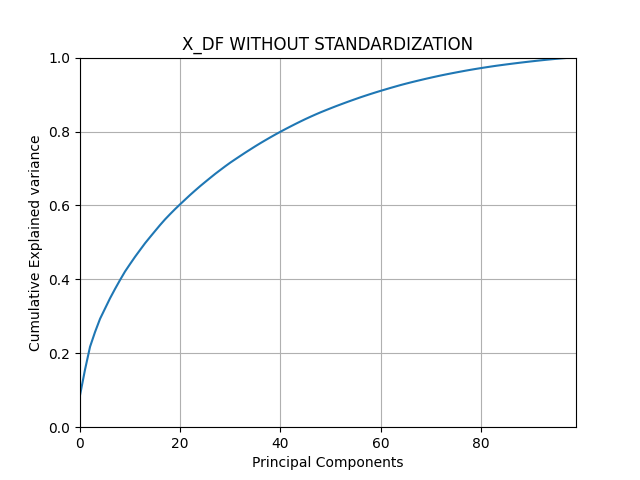

--------------------------------------------------

Number of principle components with PCA without dimensionality reduction: 99

--------------------------------------------------


In [7]:
########Dataset_without_scaling########

pca_noscale= PCA()
pca_noscale.fit(X_df.values)

plt.figure()
plt.title("X_DF WITHOUT STANDARDIZATION")
plt.plot(np.cumsum(pca_noscale.explained_variance_ratio_))
plt.ylim([0,1])
plt.xlim([0,pca_noscale.n_components_])
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal Components')
plt.grid()
plt.show()

print('-'*50)
print()
print(f'Number of principle components with PCA without dimensionality reduction: {pca_noscale.n_components_}')
print()
#print(f'Principal components of X_df without standardization:')                Run to see components
#for i in range(1,pca_noscale.components_.shape[0]+1):
    #print(f'{i}) {pca_noscale.components_}')
    #print()
print('-'*50)

The PCA applied to the dataset X_df without preprocessing through data standardization highlights the following:

- The cumulative explained variance grows exponentially for the first approximately 60 components, where we have almost 90% of the explained cumulative varince.

Observations above clearly indicate redundancy in the use of components, as most of the meaningful information from the data can be captured using less more than half of the components utilized.

Regarding the considerations on the use of dataset standardization, I refer to subsequent discussions that will be presented after illustrating all the scenarios outlined in the report.

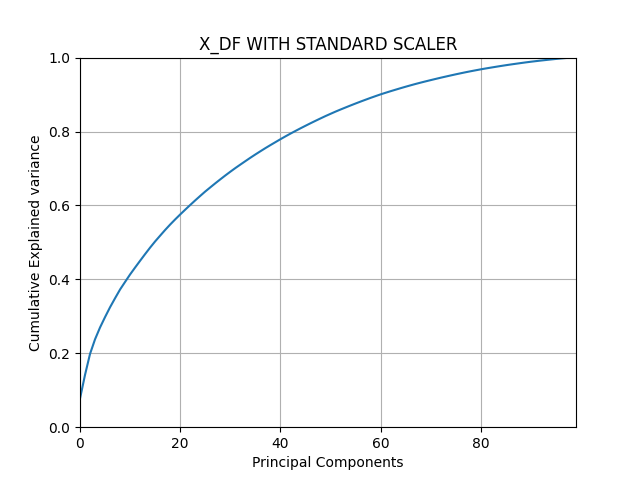

--------------------------------------------------

Number of principle components with PCA without dimensionality reduction: 99

--------------------------------------------------


In [8]:
########Dataset_with_Standard_Scaler########

pca_stscale= PCA()
pca_stscale.fit(Xstd_df)

plt.figure()
plt.title("X_DF WITH STANDARD SCALER")
plt.plot(np.cumsum(pca_stscale.explained_variance_ratio_))
plt.ylim([0,1])
plt.xlim([0,pca_stscale.n_components_])
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal Components')
plt.grid()
plt.show()

print('-'*50)
print()
print(f'Number of principle components with PCA without dimensionality reduction: {pca_stscale.n_components_}')
print()
#print(f'Principal components of X_df without standardization:')                Run to see components
#for i in range(1,pca_noscale.components_.shape[0]+1):
    #print(f'{i}) {pca_noscale.components_}')
    #print()
print('-'*50)

The application of dataset standardization through the Standard Scaler yeald to results that is not expected, as data standardization involves shifting the data, leading to a centered mean and standardized variance. This often leads to loss of power of principal components, since data are re-distribuited in space. 
Meanwhile advantages lie in the ability to work with a covariance matrix which corresponds to the correlation matrix of the original data. However, in this case, it proves to be less beneficial since the data are already within a standardized range. Indeed, due to the homoegeneous scales of data, the effect ot standardisation is almost negligible.

Nevertheless, by evaluating the results obtained from applying the Standard Scaler, we observe, particularly in the analysis of the cumulative explained variance, that approximately 60 components are required to explain around 90 percent of the variance. Even so, it remains evident that the not all components are usefull.

According to the theory, application of standard scaler should lead to a more uniform distribuition of variance but, in this case, result is less strong than in other cases, sinse data are already in a specific range of values and so variance between features is in a range of values too. Therefore effect of standard scaler is negligible concering cumulative variance explained by PCs.

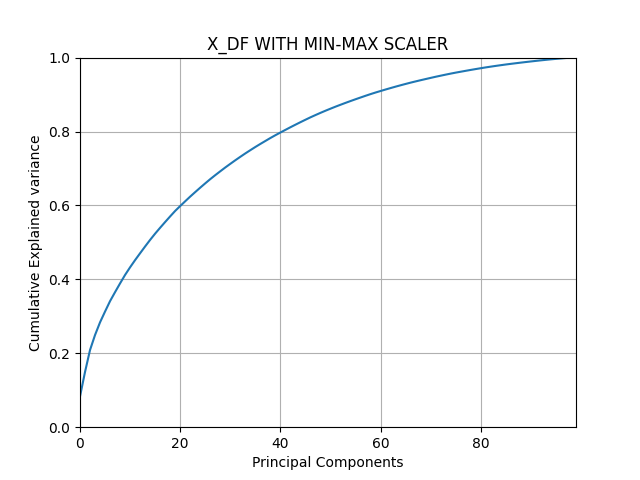

--------------------------------------------------

Number of principle components with PCA without dimensionality reduction: 99

--------------------------------------------------


In [9]:
########Dataset_with_MinMax_Scaler########

pca_minmaxscale= PCA()
pca_minmaxscale.fit(Xmm_df)

plt.figure()
plt.title("X_DF WITH MIN-MAX SCALER")
plt.plot(np.cumsum(pca_minmaxscale.explained_variance_ratio_))
plt.ylim([0,1])
plt.xlim([0,pca_minmaxscale.n_components_])
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal Components')
plt.grid()
plt.show()

print('-'*50)
print()
print(f'Number of principle components with PCA without dimensionality reduction: {pca_minmaxscale.n_components_}')
print()
#print(f'Principal components of X_df without standardization:')                Run to see components
#for i in range(1,pca_noscale.components_.shape[0]+1):
    #print(f'{i}) {pca_noscale.components_}')
    #print()
print('-'*50)


Applying the Min-Max Scaler yields results similar to those obtained with the Standard Scaler and in particular. Specifically, the Min-Max Scaler transforms the data by confining them within a defined range, for which we can specify the bounds.
This transformation facilitates the use of the available data, since data are already distribuited between max-min values (1 to 5).

While this scaling makes the data more uniform, it reduce the ability of Principal Component Analysis (PCA) to clearly identify and capture the main patterns in the data. 
We expect an higher number of components that explaine maximum variance. The reasone can be indedified with the fact that data are re-distribuited in another, fixed, range of values, so those data which has a value bounded by a subrange of values (for example [0,3]) contained in [1,5] are now gaining importance due to the rescaling of all data.

However, still remaining a coherent shape of cumulative explained variance which is means that we do not need more componets to explaine the same amount of variance. Indeed, we can notice that always 60 components are sufficient to explain around 90% of cumulative variance.

FINAL CONSIDERATIONS

The application of the Standard Scaler is not as effective as in many other cases where the data spans different ranges of values. However, despite his limited effectiveness, it is still beneficial to use as it allow for easier data management, since we can use the correlation matrix of original data.

For the Min-Max, it is evident that, due to uniform range already had by data, there is no reason to not use this tecgnique since it enshure precision and consistency. Concerning the min max scaler application, we notice that: the min max scaler changes distribution of data in a fixed range but do not change the distribution of variance between features. So due to min max scaler application, the same amount of variance is now distributed in a reshaped data in a fixed range.

Moreover, when comparing the graphs, we observe no substantial differences in the relationship between the cumulative explained variance and the number of PCs, meaning the shape of the graph remains consistent: there are no notable differences in the overall explained variance, i.e., the cumulative variance.

So, observing graphs, it is possible to say in a certain way that not every component is important to explain variances of the dataset, so we can obtain good results with almost half of components. Also, I'm referring to half of components just considering 99 components but it could be expanded to overall PCs of the complite original dataset (with all features), where this outcomes should be even more evident.

## Exercise 3. Dimensionality Reduction and PC Interpretation

In the cells below, do the following operations:
1. For each one of the two dataframes _Xstd_df_, and _Xmm_df_, compute a new PCA for performing a dimensionality reduction with respect to $m$ dimensions. The value of $m$ must be $$m = \min\{m', 5\}\,,$$ where $m'$ is the value required for obtaining $33\%$ of the total variance.
2. For both the cases, visualize all the PCs and give a name/interpretation to them. **Comment and motivate your interpretations**. If possible, **compare the differences among the results obtained** for _Xstd_df_ and _Xmm_df_.
3. Perform the score graph for both the cases (_std_ and _mm_). If $m>3$, plot the score graph with respect to the first 3 PCs. All the **plots must show the names of the PCs on the axes** for better understanding the results.
4. **Optional:** plot more score graphs, coloring the dots with respect to any label in the list _labels_ that you believe can be interesting. **Comment and analyze this optional plots**.

In [10]:
find_components_stscale= PCA(0.33,svd_solver= 'full')
find_components_stscale.fit(Xstd_df)
m= min(find_components_stscale.n_components_,5)
pca_reduction_stscale= PCA(m,svd_solver='full')
pca_reduction_stscale.fit(Xstd_df)

find_components_minmaxscale= PCA(0.33,svd_solver= 'full')
find_components_minmaxscale.fit(Xmm_df)
m=min(find_components_minmaxscale.n_components_,5)
pca_reduction_minmaxscale= PCA(m,svd_solver= 'full')
pca_reduction_minmaxscale.fit(Xmm_df)

PCA(n_components=5, svd_solver='full')

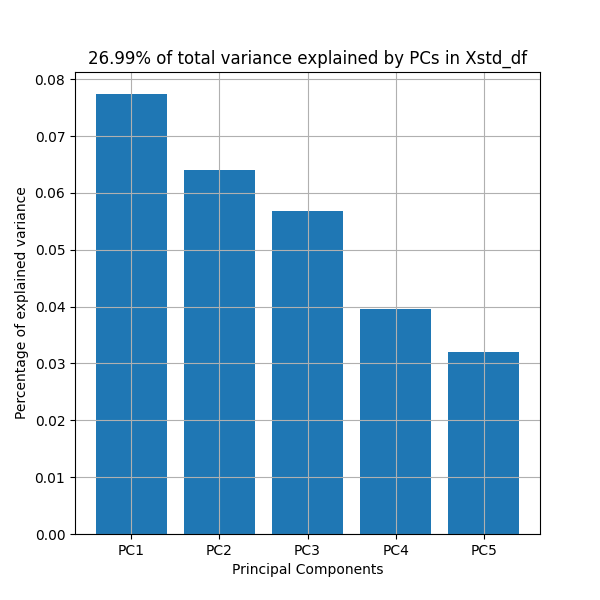

In [11]:
########PCs_Barplot_Xstd_df_Interpretation########
tot_explained_variance= np.sum(pca_reduction_stscale.explained_variance_ratio_)*100
plt.figure(figsize=(6,6))
plt.bar(range(m),pca_reduction_stscale.explained_variance_ratio_)
plt.title(f'{np.round(tot_explained_variance,2)}% of total variance explained by PCs in Xstd_df')
plt.xticks(ticks=range(m),labels=['PC1','PC2','PC3','PC4','PC5'])
plt.xlabel('Principal Components')
plt.ylabel('Percentage of explained variance')
plt.grid()
plt.show()

As expected, all of first five principal components are nedeed to explain around 26% of total variance and it is possible to notice that contribute is higher for the first components, while is decreasing for the next ones.

In [12]:
Y_stscale= pca_reduction_stscale.transform(Xstd_df)
X_tilde_stscale= pca_reduction_stscale.inverse_transform(Y_stscale)
print('-'*35,f'Xstd_df','-'*35)
print()
print(f'Representation of Xstd_df in the m-dimensional space of PCs')
print()
print('Y_stscale')
display(Y_stscale)
print('-'*50)
print()
print('X_tilde_stscale')
display(X_tilde_stscale)
print('-'*50)
print(f'Visalisation of all PCs of Xstd_df')
#display(pca_reduction_stscale.components_)

----------------------------------- Xstd_df -----------------------------------

Representation of Xstd_df in the m-dimensional space of PCs

Y_stscale


array([[ 4.69405636, -0.52516081, -1.56655424, -0.1449536 , -0.97508567],
       [-2.38510312, -2.60135939,  0.45036807, -1.25804226,  2.51214853],
       [ 1.27314283, -1.17764167,  2.59803775, -0.91302535, -2.82888414],
       ...,
       [ 5.01429112,  2.32192203,  2.72662174, -2.11920885, -1.88922052],
       [-1.54516992,  0.92581875, -2.4185442 ,  0.03339175,  1.68923286],
       [-3.68279883, -1.29581004, -0.97889355,  1.74015378,  0.3497902 ]])

--------------------------------------------------

X_tilde_stscale


array([[ 0.35711625, -0.12930313,  0.53529518, ...,  0.70378848,
        -0.23566534,  0.81732425],
       [-0.34778451,  0.17293096, -0.20925086, ..., -0.48452243,
         0.01843607, -0.32807578],
       [ 0.4215959 , -0.33263761, -0.05921803, ..., -0.16712379,
        -0.34583612,  0.90137383],
       ...,
       [ 0.71196085, -0.30998841,  0.38038238, ...,  0.88363878,
         0.43577324,  1.01547354],
       [-0.40110629,  0.12521948,  0.02819368, ...,  0.04272529,
         0.21835527, -0.8178279 ],
       [-0.39017165,  0.14958996, -0.3579352 , ..., -0.71388038,
        -0.35296104, -0.57961572]])

--------------------------------------------------
Visalisation of all PCs of Xstd_df


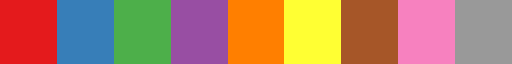

,feature,type,color
0,Finances,Finance,"(0.30196078431372547, 0.6862745098039216, 0.29..."
1,Shopping centres,Finance,"(0.30196078431372547, 0.6862745098039216, 0.29..."
2,Branded clothing,Finance,"(0.30196078431372547, 0.6862745098039216, 0.29..."
3,Entertainment spending,Finance,"(0.30196078431372547, 0.6862745098039216, 0.29..."
4,Spending on looks,Finance,"(0.30196078431372547, 0.6862745098039216, 0.29..."
...,...,...,...
94,Cheating in school,Personality,"(0.8941176470588236, 0.10196078431372549, 0.10..."
95,Questionnaires or polls,Personality,"(0.8941176470588236, 0.10196078431372549, 0.10..."
96,Assertiveness,Personality,"(0.8941176470588236, 0.10196078431372549, 0.10..."
97,Workaholism,Personality,"(0.8941176470588236, 0.10196078431372549, 0.10..."


In [13]:
#########Creating_colors_for_types_of_features########

colors= cm.Set1.colors
display(cm.Set1)

colors_dict= {}
for i,type in enumerate(these_types):               #mapping a color to a type of features
    colors_dict[type]= colors[i]
#print(colors_dict)

type_features_color=[] 
for key,values in variables_by_type.items():
    for element in these_features:
        if element in values:
            list= []
            list.append(element)
            list.append(key)
            for type,color in colors_dict.items():
                if key == type:
                    list.append(color)
            type_features_color.append(list)

datatypes= pd.DataFrame(type_features_color, columns= ['feature','type','color'])
display(datatypes)


type_feature_color= [datatypes.loc[datatypes['feature'] == feature]['color'].values[0] for feature in X_df.columns]      #Colors for types of features
colors_legend= [Line2D([0],[0], color=colors_dict[i]) for i in colors_dict.keys()]                                       #Legend to understand colors associated to category

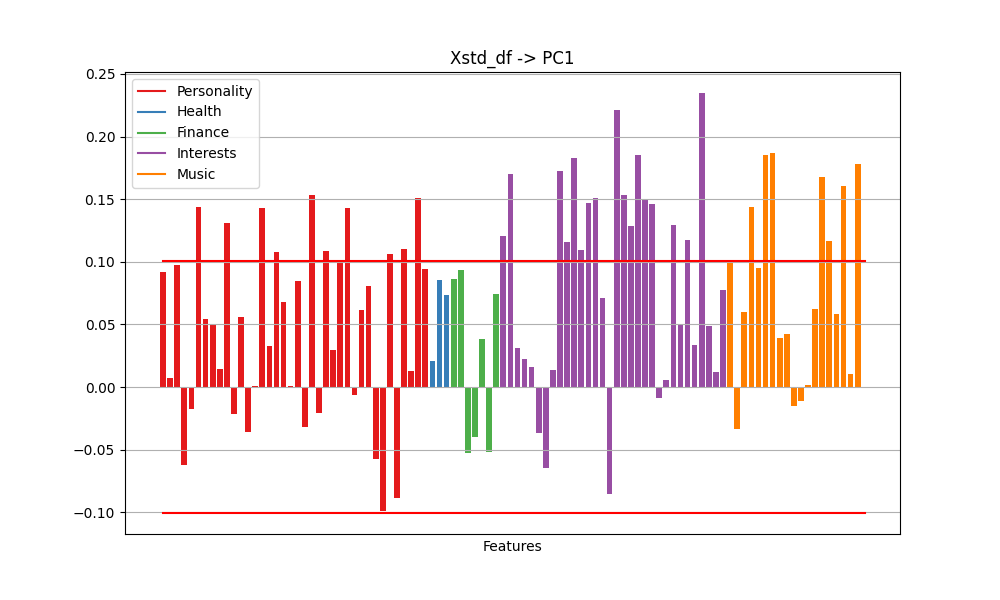

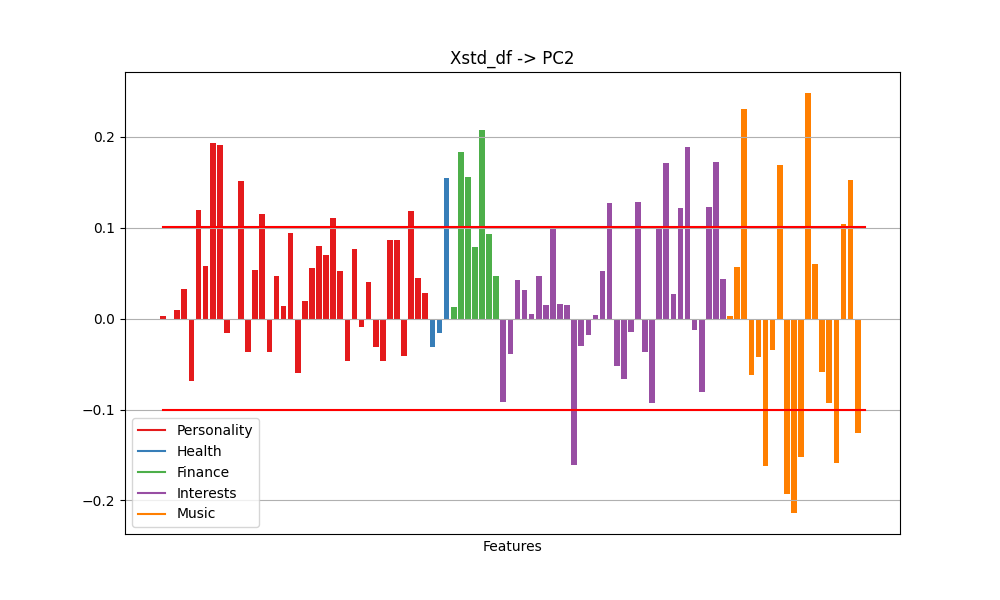

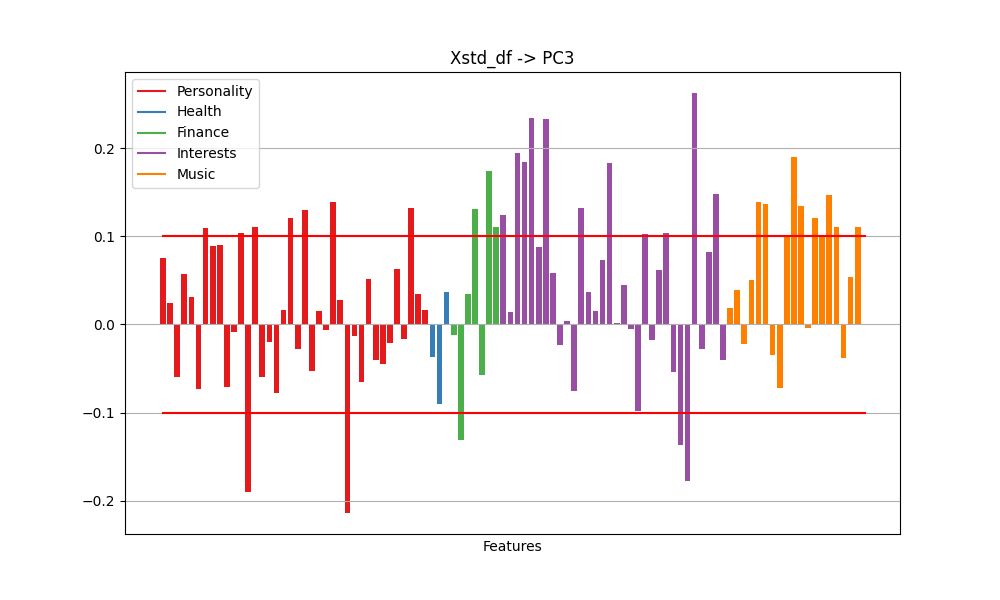

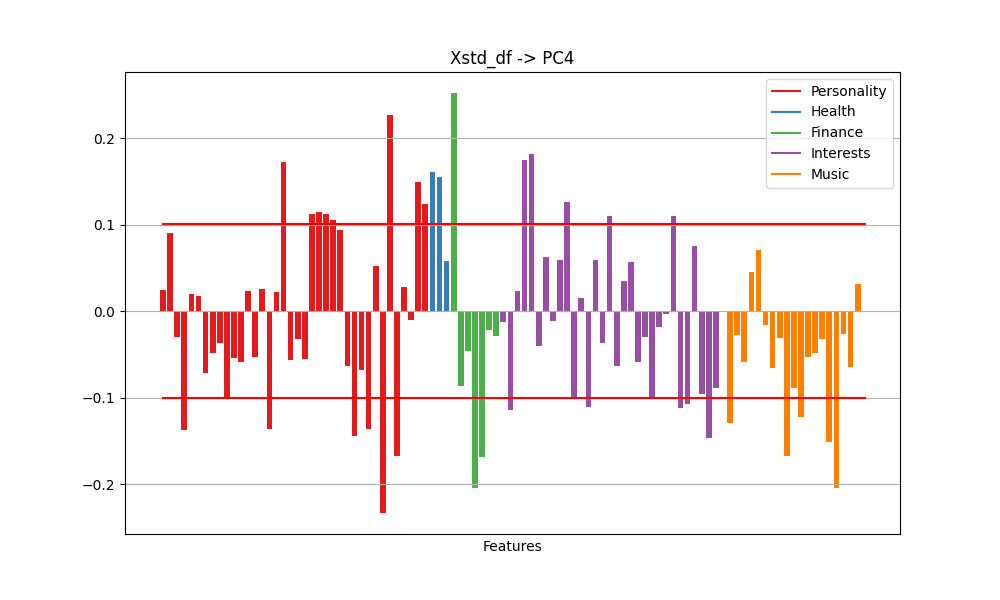

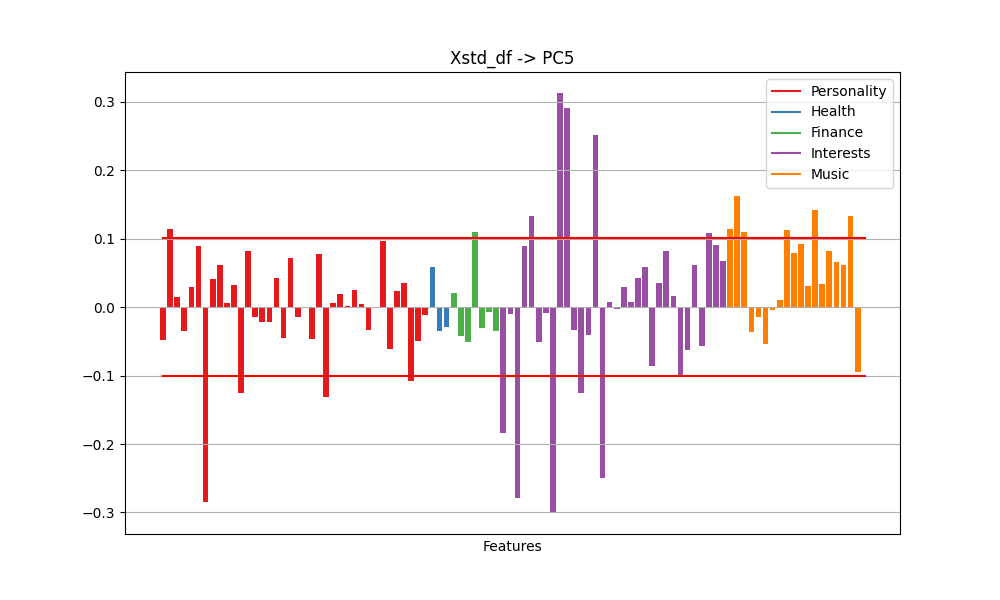

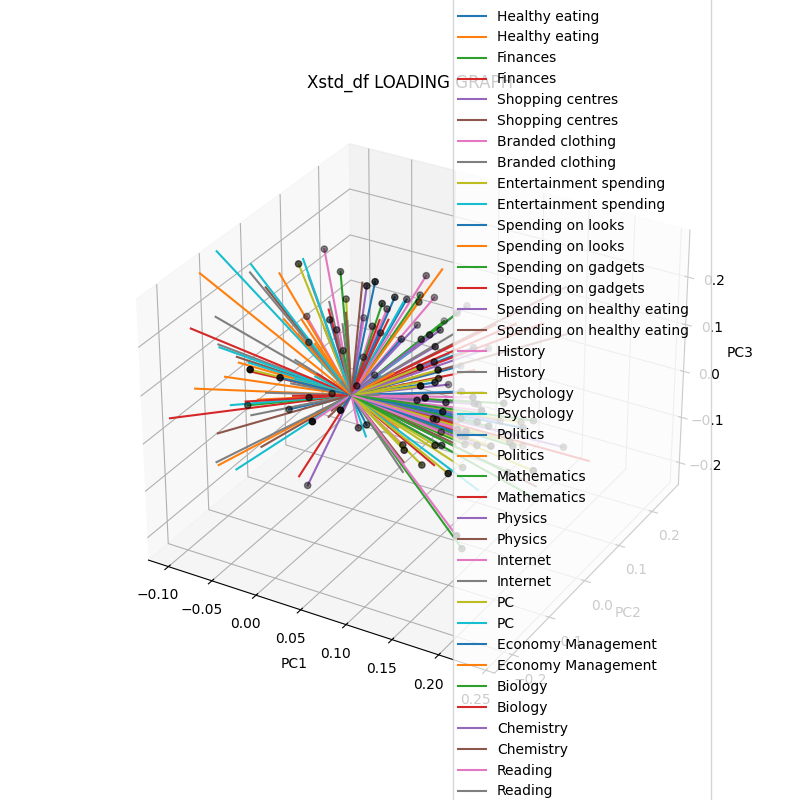

In [14]:
########PCs_Xstd_df_Interpretation########
eps = np.sqrt(1 / pca_reduction_stscale.n_features_in_)

plt.figure(figsize= (10,6))                                                                                                                #Barplot first PC
plt.bar(np.arange(pca_reduction_stscale.n_features_in_), pca_reduction_stscale.components_[0, :], color= type_feature_color)
plt.plot([0,pca_reduction_stscale.n_features_in_], [eps, eps], 'red')
plt.plot([0,pca_reduction_stscale.n_features_in_], [-eps , -eps], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_stscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.xlabel("Features")
plt.xticks([])
plt.title('Xstd_df -> PC1')
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot second PC
plt.bar(np.arange(pca_reduction_stscale.n_features_in_), pca_reduction_stscale.components_[1, :],color=type_feature_color)
plt.plot([0, pca_reduction_stscale.n_features_in_], [eps, eps], 'red')                                                                  
plt.plot([0, pca_reduction_stscale.n_features_in_], [-eps, -eps], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_stscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.xlabel("Features")
plt.xticks([])
plt.title('Xstd_df -> PC2')
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot third PC
plt.bar(np.arange(pca_reduction_stscale.n_features_in_), pca_reduction_stscale.components_[2, :],color=type_feature_color)
plt.plot([0, pca_reduction_stscale.n_features_in_], [eps, eps], 'red')
plt.plot([0, pca_reduction_stscale.n_features_in_], [-eps, -eps], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_stscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.xticks([])
plt.xlabel("Features")
plt.title('Xstd_df -> PC3')
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot fourth PC
plt.bar(np.arange(pca_reduction_stscale.n_features_in_), pca_reduction_stscale.components_[3, :],color=type_feature_color)
plt.plot([0, pca_reduction_stscale.n_features_in_], [eps, eps], 'red')
plt.plot([0, pca_reduction_stscale.n_features_in_], [-eps, -eps], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_stscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.xlabel("Features")
plt.xticks([])
plt.title('Xstd_df -> PC4')
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot fifth PC
plt.bar(np.arange(pca_reduction_stscale.n_features_in_), pca_reduction_stscale.components_[4, :],color=type_feature_color)
plt.plot([0, pca_reduction_stscale.n_features_in_], [eps, eps], 'red')
plt.plot([0, pca_reduction_stscale.n_features_in_], [-eps , -eps], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_stscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.xlabel("Features")
plt.xticks([])
plt.title('Xstd_df -> PC5')
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection':'3d'})                                        #Create Loading graph, increase y figsize to show full legend
for i in range(pca_reduction_stscale.n_features_in_):                                                           #plotting each PC with the respect of each feature
    ax.plot([0, pca_reduction_stscale.components_[0, i]], [0, pca_reduction_stscale.components_[1, i]], 
               [0, pca_reduction_stscale.components_[2, i]], [0, pca_reduction_stscale.components_[3, i]],
               [0, pca_reduction_stscale.components_[4, i]], label=mydataset.columns[i])                           
ax.scatter(pca_reduction_stscale.components_[0, :], pca_reduction_stscale.components_[1, :],
                 pca_reduction_stscale.components_[2, :], c='k')
ax.legend(markerscale= 0.5, loc= 'right')
ax.set_title('Xstd_df LOADING GRAPH')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.grid(visible=True, which='both')
plt.show()

## Red personality, blue bad habits, green finances, purple activities and interets, orange music preferences

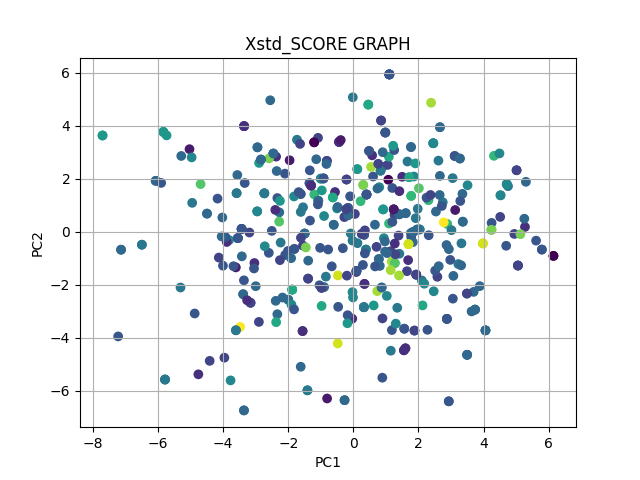

In [15]:
###2D_score_graph_Xstd###
plt.figure()
plt.scatter(Y_stscale[:, 0], Y_stscale[:, 1], c= labels_train['Age'].values)
plt.title('Xstd_SCORE GRAPH')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

In [16]:
########Find_usefull_features_for_Xstd########

for i in range(m):
    positive_indexes = np.argwhere(pca_reduction_stscale.components_[i, :] >= eps).flatten()
    negative_indexes = np.argwhere(pca_reduction_stscale.components_[i, :] <= -eps).flatten()
    
    over_positive_treshold = [mydataset.columns[j] for j in positive_indexes]
    under_negative_treshold = [mydataset.columns[j] for j in negative_indexes]

    print('')
    print(f'****************** PC{i+1} **********************')
    print(f'Usefull Positive Components: {over_positive_treshold}')
    print('')
    print(f'Usefull Negative Components: {under_negative_treshold}')
    print('*********************************************')
    print('')



****************** PC1 **********************
Usefull Positive Components: ['Children', 'Empathy', 'Giving', 'God', 'Writing notes', 'Reliability', 'Keeping promises', 'Life struggles', 'Prioritising workload', 'Questionnaires or polls', 'Workaholism', 'History', 'Psychology', 'Biology', 'Chemistry', 'Reading', 'Geography', 'Foreign languages', 'Medicine', 'Art exhibitions', 'Religion', 'Countryside, outdoors', 'Dancing', 'Musical instruments', 'Writing', 'Gardening', 'Shopping', 'Theatre', 'Music', 'Folk', 'Classical music', 'Musical', 'Swing, Jazz', 'Rock n roll', 'Latino', 'Opera']

Usefull Negative Components: []
*********************************************


****************** PC2 **********************
Usefull Positive Components: ['Children', 'Socializing', 'Number of friends', 'Knowing the right people', 'Giving', 'Happiness in life', 'Assertiveness', 'Healthy eating', 'Shopping centres', 'Branded clothing', 'Spending on looks', 'Economy Management', 'Cars', 'Dancing', 'Activ

Since we can see that Loadig graph is not a useful tool in this situation, due to the amount of Principal Components larger than three, the only way to understand the meaning of PCs and to give them an interpretation is to visualize barplots of them. This approach is consistent because the change of basis is performed using the orthogonal matrix P, whose columns are the eigenvectors of the correlation matrix (in the case of the standardized dataset, the covariance matrix of scaled data corresponds to correlation matrix of original data) expressed in the canonical basis. Conversely, the columns of P represent the canonical basis vectors expressed in the new basis of the Principal Components. Essentially, we observe that reasoning through the loading graph or the bar plots is entirely equivalent. The loading graph uses the Principal Components as reference axes (which correspond to the rows of P), while in the bar plots, the columns of P are represented within the coefficients of the features.

Another clarification concerns the use of the imposed threshold, above which (both positive and negative) a feature represents a meaningful variation for understanding the principal component's significance. In fact, the use of a threshold is driven by the need to reduce the number of features, as having too many would lead to a poor interpretability of the principal component. The threshold was determined using a heuristic approach, which led to the decision to set epsilon = 1/n, where n is the total number of features in my dataset (99). This choice is reasonable, as all principal components have coefficient values within a range that includes enough features above the positive threshold and below the negative threshold, allowing for meaningful considerations about the principal components.

Now, let us move on to the interpretation of the principal components.

PC1)
moving in the positive direction it is possible to observe:

Personality traits:
- Empathy and emotional sensitivity: Enjoying the company of children, crying in difficult moments, and being more empathetic show an emotionally open and caring personality.
- Responsibility and discipline: Writing notes to stay organized, keeping promises, and being efficient at work indicate a responsible and structured approach to life.
- Spirituality and moral values: Belief in God and the joy of giving Christmas gifts suggest traditional values and a generous spirit.

Finantial Habits:
- The tendency to shop could represent a bit of indulgence or self-expression. However, given the overall discipline and ability to prioritize work, it seems balanced and not excessive

Activities and Interests:
- Intellectual curiosity: Interests in history, psychology, biology, reading, foreign languages, and similar topics show a love for learning and personal growth.
- Creative and artistic pursuits: Dancing, playing musical instruments, writing, and gardening suggest a creative side and a way to express feelings and ideas.
- Connection with nature: Walking outdoors and gardening highlight a sense of relaxation and love for the environment.

Music Preferences:
- Enjoying genres like folk, classical, swing, rock and roll, Latin, and opera reflects a diverse and sophisticated musical taste, often linked to emotional depth or cultural appreciation.

Bad Habits:
- This component doesn’t focus much on negative traits. Instead, it shows a balance between responsibility (prioritizing work, keeping promises) and indulgence (shopping, working in free time).


As a result of what has just ben analysed, a possible name that can be assigned to the PC1 is "Emotional and Disciplined", because:
- Emotional: Reflects a person who has emotional behaviours in life as seen previously
- Disciplined: highlights a person who always focus on right way to do things, including work.

So we have in a positive direction "Emotional and Disciplined"(+) and in a negative direction "Apathetic and undisciplined"(-)

PC2)
moving in the positive direction it is possible to observe:

Personality traits:
- Social and extroverted: Enjoying the company of children, socializing, having many friends, and valuing connections with the "right people" reflect an extroverted and people-oriented personality.
- Optimistic and confident: Increased happiness in life and a tendency to express opinions when confident suggest a positive outlook and self-assurance.
- Generous and celebratory: The joy of giving gifts at Christmas emphasizes generosity and enjoyment of shared moments.

Finantial Habits:
- Focus on appearance and lifestyle: Spending money on healthy food, shopping, branded clothing, and maintaining a polished look indicates a focus on self-presentation and quality of life.
- Interest in financial management: A desire to manage finances shows responsibility alongside the inclination to enjoy spending.

Activities and Interests:
- Active and thrilling lifestyle: Interests in cars, dancing, active sports, adrenaline sports, and having fun with friends point to a dynamic, adventurous, and socially engaging lifestyle.
- Pop culture and celebrity focus: Interest in celebrities and entertainment reflects alignment with modern trends and cultural phenomena.
- Reduced focus on reflective or traditional activities: A decreased interest in reading, classical music, and traditional genres like rock, metal, or opera suggests a preference for contemporary and exciting experiences over introspection.

Music Preferences:
- Contemporary and energetic tastes: A strong preference for pop, hip-hop, Latin, and techno aligns with a love for lively, socially engaging, and danceable music.
- Less interest in alternative or intellectual genres: The reduced interest in classical, rock, metal, punk, and opera indicates a move away from genres that are often associated with introspection or niche cultural movements.

Bad Habits:
- This component doesn’t focus much on negative traits concerning bad habits like smoking or drinking. So these features are not in interests since them are under the treshold.


As a result of what has just ben analysed, a possible name that can be assigned to the PC2 is "Extroverted and Showy", because:
- Extroverted: Reflects a person who is actually ejoyng stay with people and comfortable in explain his ideas
- Showy: highlights a person who always cares about his apparence, so buying brended clothing ad loves shopping i general

So we have in a positive direction "Extroverted and Showy"(+) and in a negative direction "Introvert and Modest"(-)

PC3)
moving in the positive direction it is possible to observe:

Personality traits:
- Curiosity and Observation: The tendency to observe what is happening around oneself indicates a person who is attentive, perceptive, and aware of their environment.
- Social and Adaptable: The ability to connect with the right people, adapt to changes, and be the most fun in social settings shows a person who values relationships and thrives in dynamic situations.
- Confidence and Openness: The ability to express opinions when sure and a general happiness in life suggest a confident and positive personality, comfortable with self-expression and in comfortable social settings.

Finantial Habits:
- Spending on Experiences: A tendency to spend money on fun with friends and spending on gadgets or healthy food points to an individual who values experiences, self-care, and enjoyment over material possessions.
- Pragmatic Spending: The focus on spending for enjoyment and health rather than for excessive shopping or fleeting trends indicates a balanced attitude toward finances, prioritizing well-being and entertainment.

Activities and Interests:
- Intellectual Curiosity: A deep interest in subjects like history, politics, mathematics, physics, geography, and science/technology shows a person with a thirst for knowledge and intellectual growth.
- Active Lifestyle: Interests in active sports, adrenaline sports, and musical instruments reflect a person who enjoys both intellectual and physical engagement with the world.
- Technical and Mechanical Interests: A fondness for PCs and cars signals an interest in technology, engineering, and the practical application of knowledge.

Music Preferences:
- Diverse Musical Tastes: The variety of music preferences, including country, classical, rock, metal, punk, reggae, rock and roll, alternative, and opera, highlights an eclectic and broad appreciation for different cultural and emotional expressions through music. These genres often reflect a desire for depth and intensity in artistic experiences.

Bad Habits:
- This component doesn’t focus much on negative traits. Instead, it shows a balance between responsibility (prioritizing work, keeping promises) and indulgence (shopping, working in free time).

Decreaed Features: 
- Reduced Interest in Fame and Superficiality: The decline in interest in public speaking, crying in difficult situations, and excessive spending on shopping or celebrity culture shows a person who is more grounded and less inclined toward superficial or external validation.
- Focus on Substance Over Style: The decreased interest in celebrities and general shopping suggests someone who is more focused on deeper, more meaningful aspects of life rather than trends or materialism.

As a result of what has just ben analysed, a possible name that can be assigned to the PC3 is "Social Expert", because:
- Social Expert: Reflects a person that is able to handle social situations and cares about funny.

So we have in a positive direction "Social Expert"(+) and in a negative direction "Reserved"(-)

PC4)
moving in the positive direction it is possible to observe:

Personality traits:
- Organized and Responsible: The tendency to think ahead, write notes to avoid forgetting things, and prioritize work shows a highly organized and responsible personality, capable of managing tasks efficiently.
- Work-Oriented: The focus on being responsible at work, working during leisure time, and always striving to meet obligations reflects a strong work ethic and dedication to professional responsibilities.
- Happiness and Planning: The increased happiness in life and the tendency to plan and be organized suggest a mindset that values stability and structure, with a focus on self-improvement and goal achievement.

Finantial Habits:
- Interest in Finance and Practical Matters: The increased interest in finance, math, physics, and machinery indicates an analytical mindset that enjoys logical thinking and problem-solving, often associated with a practical approach to financial and academic matters.

Activities and Interests:
- Intellectual Interests: A strong interest in math, physics, chemistry shows a tendency towards structured, scientific thinking and a passion for technical subjects.
- Gardening: An interest in gardening suggests a more grounded, hands-on hobby that offers relaxation and connection to nature, balancing the more intellectual aspects of this personality.

Music Preferences:
- Music preferences are only decreasing through positive direction of PC

Bad Habits:
- Increased Smoking and Drinking: The rise in smoking and alcohol consumption could reflect stress or a way of coping with the pressure of maintaining high levels of responsibility and work dedication. These habits contrast with the otherwise goal-oriented and responsible aspects of this person's personality.

Decreased Features:
- Reduced Emotional Reactivity: Decreased tendencies to destroy things in moments of anger or to point out when someone is not listening suggest a reduction in emotional outbursts and a more controlled, measured way of handling frustration.
- Reduced Interest in Social and Emotional Aspects: The decreased empathy and loss of interest in psychology, reading, foreign languages, celebrities, and social fun with friends point to a decline in emotionally-driven or interpersonal interests. This person seems to focus more on intellectual pursuits and work rather than emotional connections or social engagement.
- Less Interest in Entertainment and Aesthetic Appearance: The reduced interest in spending on fun with friends, shopping for personal appearance, and certain music genres (rock, punk, alternative) suggests a shift away from social, external expressions of self and towards internal, intellectual, or work-related priorities


As a result of what has just ben analysed, a possible name that can be assigned to the PC4 is "Science-Oriented", because:
- Science-Oriented: reflect a person who is behaviour is extremely influenced by studyies that concern his life. 

So we have in a positive direction "Science-Oriented"(+) and in a negative direction "Humanist"(-)

PC5)
moving in the positive direction it is possible to observe:

Personality traits:
- Tendency to Lie: The increased tendency to lie could suggest a person who may seek to avoid confrontation, present themselves in a more favorable light, or escape from difficult situations. This behavior might indicate a lack of confidence or avoidance of responsibility.
- Less Interest in Responsibility: A decreased sense of responsibility, especially related to work or expressing one's opinion, points to a person who may prefer to avoid serious duties and commitments, possibly in favor of more carefree activities.

Finantial Habits:
- Spending on Entertainment: The increased tendency to spend money on entertainment indicates a focus on leisure activities, fun, and enjoyment. This person likely values experiences and socializing over saving or investing in more practical matters.
- Escapism through Spending: The focus on entertainment spending, combined with the tendency to lie, may suggest that this individual is seeking escape or relief from stress through indulgent activities.

Activities and Interests:
- Intellectual Interests in Science and Medicine: The increased interest in physics, biology, chemistry, and medicine reflects a fascination with scientific exploration and understanding. This may indicate curiosity and a desire to learn about the natural world, but it might also point to an interest in knowledge that can be more theoretical rather than applied to practical life.
- Interest in Music and Fun with Friends: The increased interest in enjoying time with friends and engaging in music, especially slow and fast songs, suggests that socializing, entertainment, and musical expression are central to this person's life.

Music Preferences:
- Enjoying genres like rock, reggae, and techno reflects a taste for energetic, dynamic, and sometimes rebellious musical styles. These genres may be associated with a desire for excitement, freedom, and emotional release.

Bad Habits:
- This component doesn’t focus much on negative traits. 

Decreased Features:
- Reduced Interest in Responsibility and Emotional Expression: The decreased tendency to express opinions or take responsibility at work shows a shift away from more serious, grounded activities. This person may avoid confronting difficult issues or responsibilities.
- Decreased Interest in Intellectual and Practical Pursuits: The decreased interest in history, politics, finance, geography, and law suggests a loss of interest in long-term, practical concerns or societal issues, favoring instead immediate gratification and personal enjoyment.
- Less Awareness of Environment: The reduced tendency to notice what’s happening around them indicates a more inward-focused or distracted person, possibly less engaged with external realities or events.


As a result of what has just ben analysed, a possible name that can be assigned to the PC5 is "Distracted and Intellectual", because:
- Distracted: highlights a person who is avoiding social activities
- Intellectual: Reflects a person who is focus on studyies and important fields not related to society.

So we have in a positive direction "Distracted and Intellectual"(+) and in negatuve direction "Responsible and Superficial"(-)

In [17]:
pcsStd_names= ["Emotional and Disciplined(+) Vs Apathetic and undisciplined(-)",
               "Extroverted and Showy(+) Vs Introvert and Modest(-)",
               "Social Expert(+) Vs Reserved(-)",
               "Science-Oriented(+) Vs Humanist(-)",
               "Distracted and Intellectual(+) Vs Responsable and Superficial(-)"]

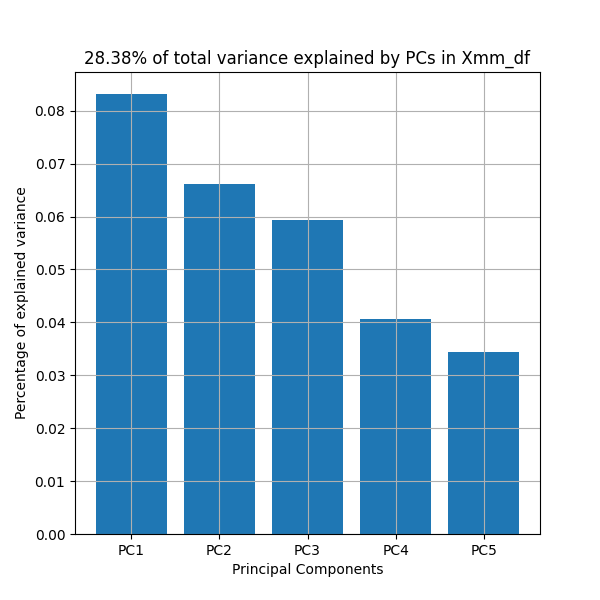

In [18]:
########PCs_Barplot_Xmm_df_Interpretation########
tot_explained_variance= np.sum(pca_reduction_minmaxscale.explained_variance_ratio_)*100
plt.figure(figsize=(6,6))
plt.bar(range(m),pca_reduction_minmaxscale.explained_variance_ratio_)
plt.title(f'{np.round(tot_explained_variance,2)}% of total variance explained by PCs in Xmm_df')
plt.xticks(ticks=range(m),labels=['PC1','PC2','PC3','PC4','PC5'])
plt.xlabel('Principal Components')
plt.ylabel('Percentage of explained variance')
plt.grid()
plt.show()

In [19]:
Y_minmaxscale= pca_reduction_minmaxscale.transform(Xmm_df)
X_tilde_minmaxscale= pca_reduction_minmaxscale.inverse_transform(Y_minmaxscale)
print('-'*35,f'Xmm_df','-'*35)
print()
print(f'Representation of Xmm_df in the m-dimensional space of PCs')
print()
print('Y_minmaxscale')
display(Y_minmaxscale)
print('-'*50)
print()
print('X_tilde_minmaxscale')
display(X_tilde_minmaxscale)
print('-'*50)
print(f'Visalisation of all PCs of Xmm_df')
#display(pca_reduction_minmaxscale.components_)

----------------------------------- Xmm_df -----------------------------------

Representation of Xmm_df in the m-dimensional space of PCs

Y_minmaxscale


array([[ 5.38333698, -0.55794639, -0.27418063, -0.75768625,  0.74508659],
       [-2.49173149,  3.37425065,  0.35344891,  0.14598361,  3.98808413],
       [ 1.21962946,  1.92601351,  4.00101263, -1.62502516, -0.57930042],
       ...,
       [ 5.52201435, -2.53289254,  4.34483599, -3.43576737, -2.30219608],
       [-1.92248785, -1.48324606, -2.89209582,  0.05159942,  1.21875666],
       [-4.15110967,  1.40009404, -1.83199347,  2.21677529, -0.34829538]])

--------------------------------------------------

X_tilde_minmaxscale


array([[3.85872353, 4.00589064, 4.54987268, ..., 3.84858248, 2.46855397,
        2.89456696],
       [2.55495672, 4.1982709 , 3.8880075 , ..., 2.05225007, 2.45703224,
        1.89895942],
       [4.05766506, 3.87075942, 3.9799097 , ..., 2.87491358, 2.39173649,
        3.05011858],
       ...,
       [4.76950652, 3.59493518, 4.39126555, ..., 4.19239461, 2.91268336,
        3.35560364],
       [2.62297885, 3.96204331, 4.09538419, ..., 2.74971858, 2.4239193 ,
        1.32008067],
       [2.81806763, 4.18355858, 3.74288378, ..., 1.94717811, 1.71821252,
        1.5680257 ]])

--------------------------------------------------
Visalisation of all PCs of Xmm_df


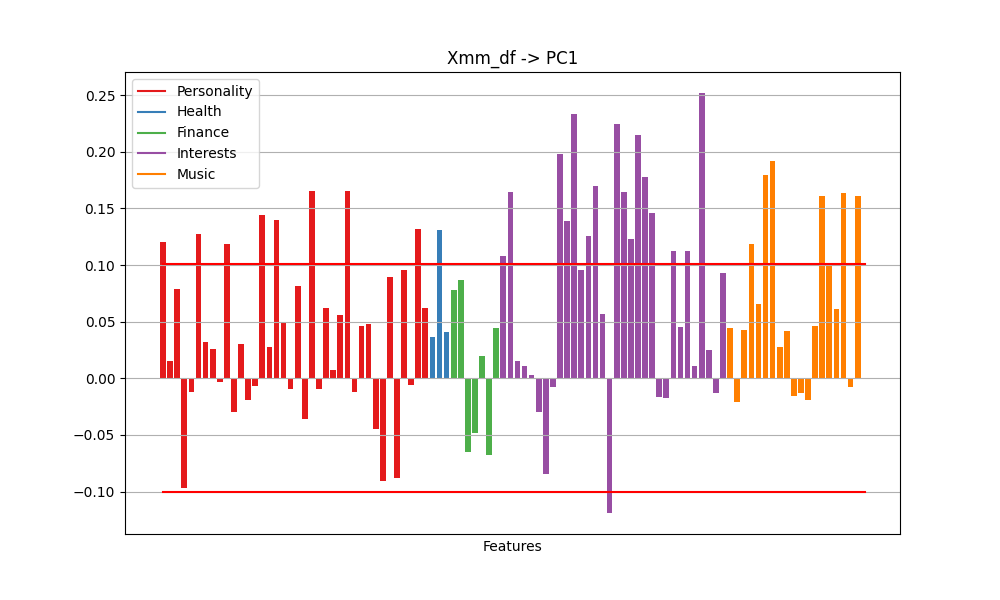

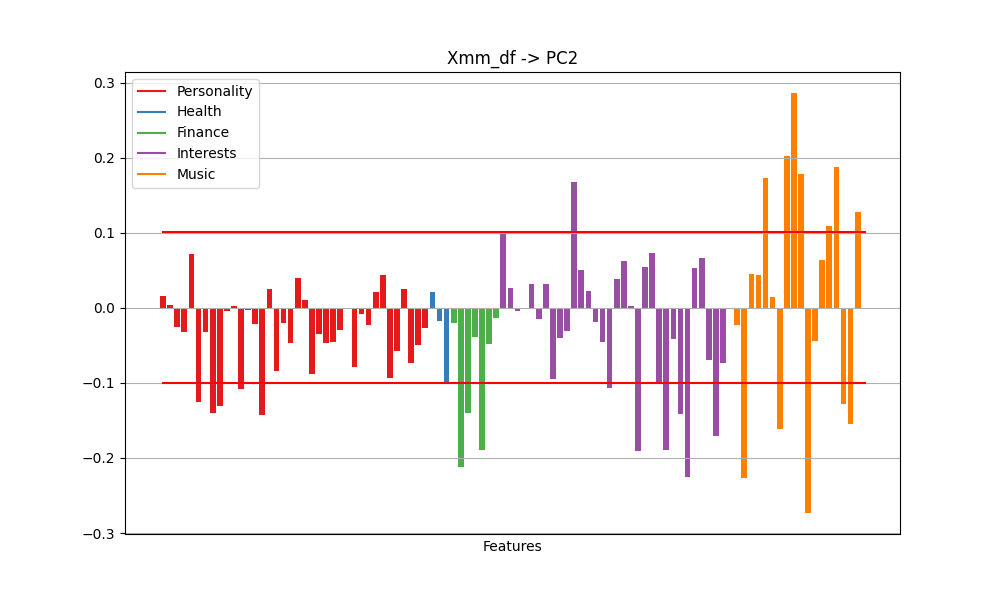

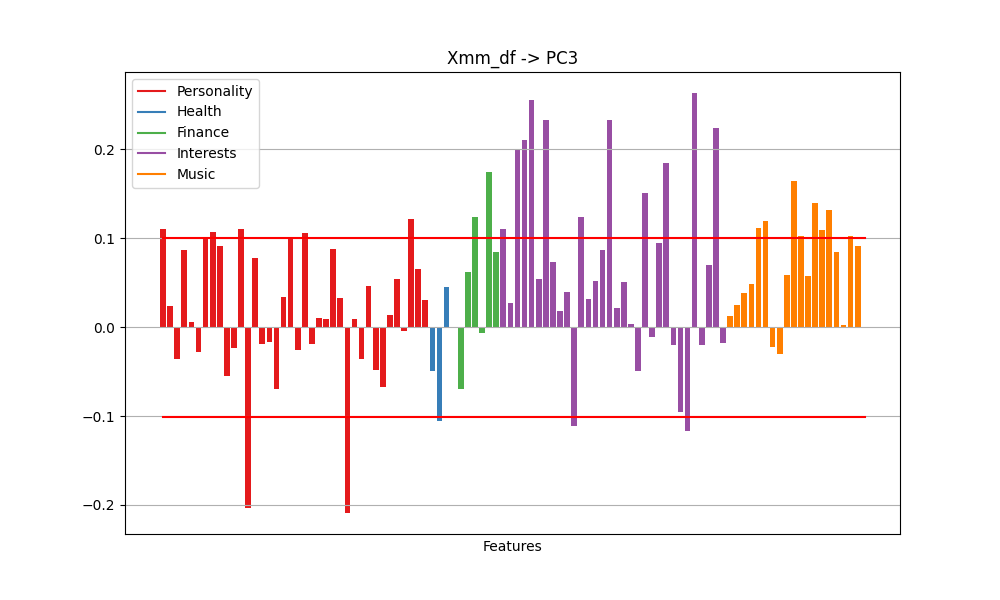

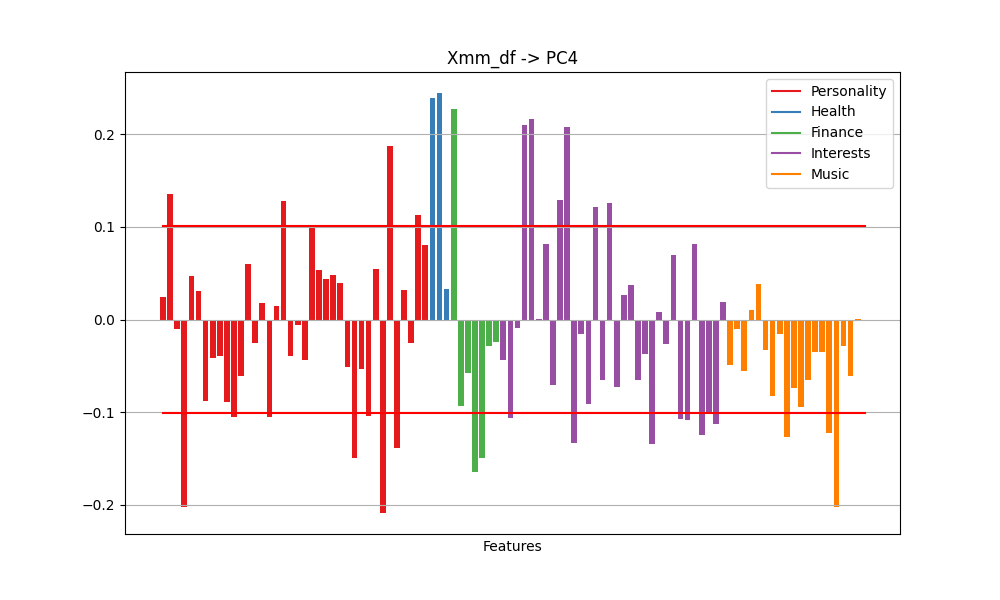

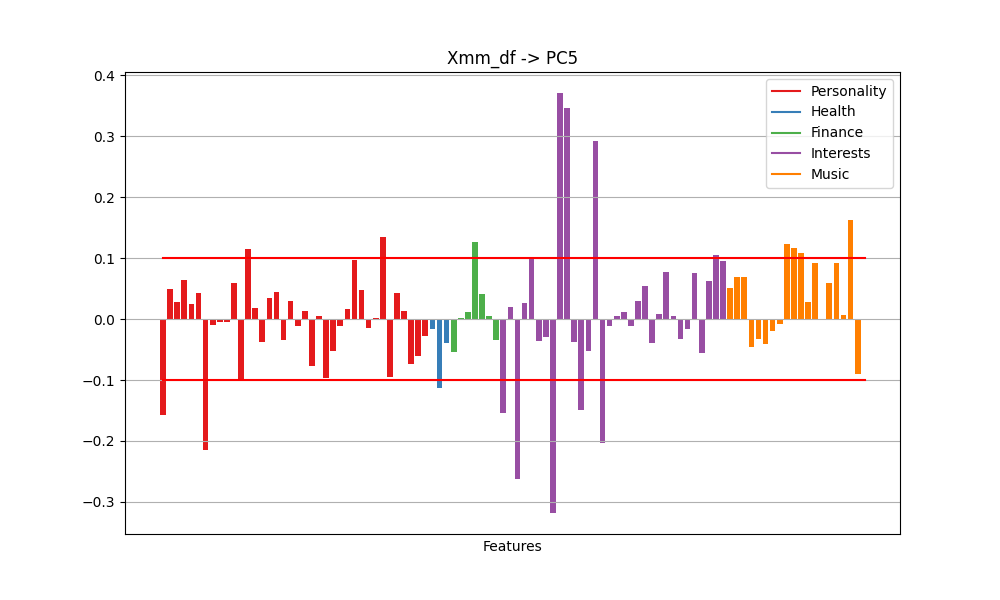

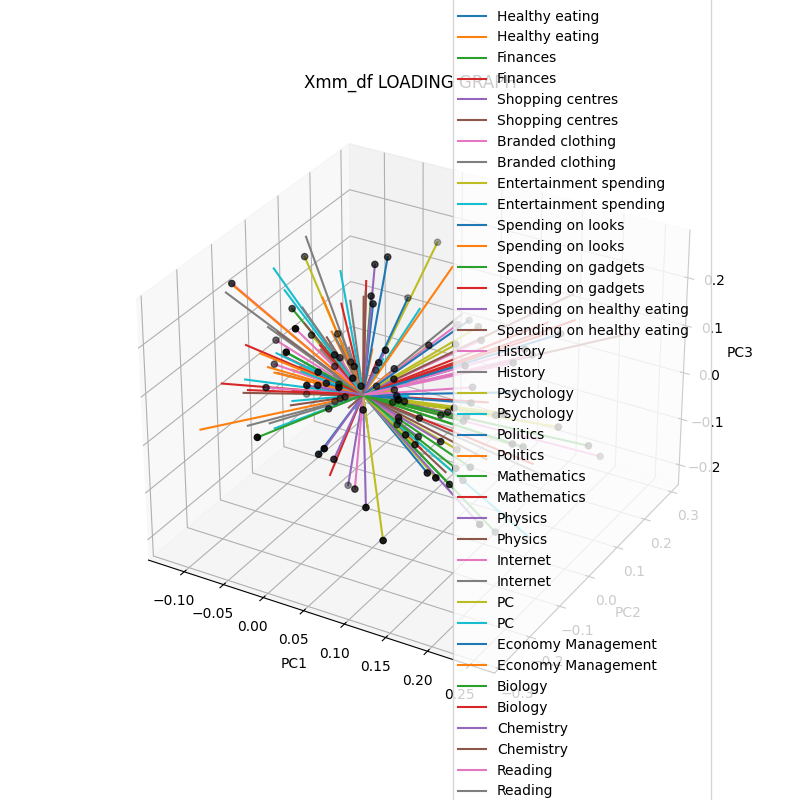

In [20]:
########PCs_Xmm_df_Interpretation########
eps_2 = np.sqrt(1 / pca_reduction_minmaxscale.n_features_in_)

plt.figure(figsize= (10,6))                                                                                                                #Barplot first PC
plt.bar(np.arange(pca_reduction_minmaxscale.n_features_in_), pca_reduction_minmaxscale.components_[0, :], color=type_feature_color)
plt.plot([0,pca_reduction_minmaxscale.n_features_in_], [eps_2, eps_2], 'red')
plt.plot([0,pca_reduction_minmaxscale.n_features_in_], [-eps_2,-eps_2], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_minmaxscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.xlabel("Features")
plt.xticks([])
plt.title('Xmm_df -> PC1')
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot second PC
plt.bar(np.arange(pca_reduction_minmaxscale.n_features_in_), pca_reduction_minmaxscale.components_[1, :],color=type_feature_color)             
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [eps_2, eps_2], 'red')                                                                                                       
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [-eps_2, -eps_2], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_minmaxscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.title('Xmm_df -> PC2')
plt.xlabel("Features")
plt.xticks([])
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot third PC
plt.bar(np.arange(pca_reduction_minmaxscale.n_features_in_), pca_reduction_minmaxscale.components_[2, :],color=type_feature_color)
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [eps_2, eps_2], 'red')
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [-eps_2,-eps_2], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_minmaxscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.title('Xmm_df -> PC3')
plt.xlabel("Features")
plt.xticks([])
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot fourth PC
plt.bar(np.arange(pca_reduction_minmaxscale.n_features_in_), pca_reduction_minmaxscale.components_[3, :],color=type_feature_color)
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [eps_2, eps_2], 'red')
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [-eps_2 , -eps_2], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_minmaxscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.title('Xmm_df -> PC4')
plt.xlabel("Features")
plt.xticks([])
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

plt.figure(figsize= (10,6))                                                                                                                #Barplot fifth PC
plt.bar(np.arange(pca_reduction_minmaxscale.n_features_in_), pca_reduction_minmaxscale.components_[4, :],color=type_feature_color)
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [eps_2, eps_2], 'red')
plt.plot([0, pca_reduction_minmaxscale.n_features_in_], [-eps_2 , -eps_2], 'red')
#plt.xticks(ticks=np.arange(pca_reduction_minmaxscale.n_features_in_), 
           #labels=mydataset.columns.to_list(),
           #rotation=90)
plt.title('Xmm_df -> PC5')
plt.xlabel("Features")
plt.xticks([])
plt.legend(handles = colors_legend, labels= colors_dict.keys())
plt.grid()
plt.show()

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection':'3d'})                                            #Create Loading graph, increase y figsize to show full legend
for i in range(pca_reduction_minmaxscale.n_features_in_):                                                           #plotting each PC with the respect of each feature
    ax.plot([0, pca_reduction_minmaxscale.components_[0, i]], [0, pca_reduction_minmaxscale.components_[1, i]], 
               [0, pca_reduction_minmaxscale.components_[2, i]], [0, pca_reduction_minmaxscale.components_[3, i]],
               [0, pca_reduction_minmaxscale.components_[4, i]], label=mydataset.columns[i])                           
ax.scatter(pca_reduction_minmaxscale.components_[0, :], pca_reduction_minmaxscale.components_[1, :],
                 pca_reduction_minmaxscale.components_[2, :], c='k')
ax.legend(markerscale= 0.5, loc= 'right')
ax.set_title('Xmm_df LOADING GRAPH')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.grid(visible=True, which='both')
plt.show()

/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/1118881916.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


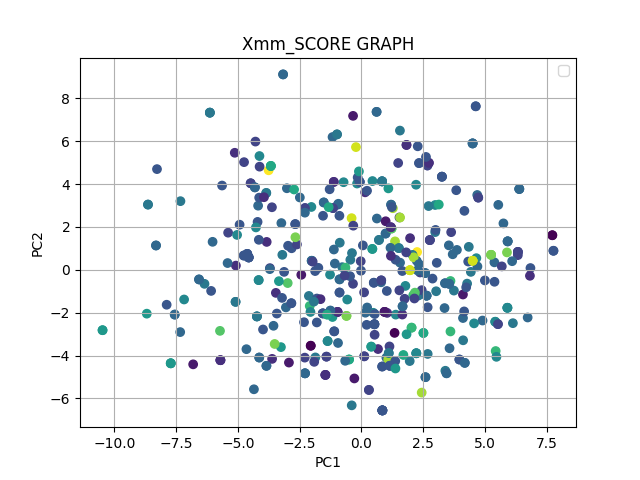

In [21]:
###2D_score_graph_Xmm###
plt.figure()
plt.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1],c= labels_train['Age'].values)
plt.title('Xmm_SCORE GRAPH')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid()
plt.show()

In [22]:
########Find_usefull_features########

for i in range(m):
    positive_indexes_mm = np.argwhere(pca_reduction_minmaxscale.components_[i, :] >= eps).flatten()
    negative_indexes_mm = np.argwhere(pca_reduction_minmaxscale.components_[i, :] <= -eps).flatten()
    
    over_positive_treshold_mm = [mydataset.columns[j] for j in positive_indexes_mm]
    under_negative_treshold_mm = [mydataset.columns[j] for j in negative_indexes_mm]

    print('')
    print(f'****************** PC{i+1} **********************')
    print(f'Usefull Positive Components: {over_positive_treshold_mm}')
    print('')
    print(f'Usefull Negative Components: {under_negative_treshold_mm}')
    print('*********************************************')
    print('')


****************** PC1 **********************
Usefull Positive Components: ['Elections', 'Children', 'Empathy', 'Giving', 'God', 'Writing notes', 'Life struggles', 'Workaholism', 'Alcohol', 'History', 'Psychology', 'Biology', 'Chemistry', 'Reading', 'Foreign languages', 'Medicine', 'Art exhibitions', 'Religion', 'Countryside, outdoors', 'Dancing', 'Musical instruments', 'Writing', 'Gardening', 'Shopping', 'Theatre', 'Folk', 'Classical music', 'Musical', 'Swing, Jazz', 'Rock n roll', 'Latino', 'Opera']

Usefull Negative Components: ['Cars']
*********************************************


****************** PC2 **********************
Usefull Positive Components: ['History', 'Reading', 'Classical music', 'Rock', 'Metal or Hardrock', 'Punk', 'Rock n roll', 'Alternative', 'Opera']

Usefull Negative Components: ['Children', 'Socializing', 'Number of friends', 'Knowing the right people', 'Giving', 'Healthy eating', 'Shopping centres', 'Branded clothing', 'Spending on looks', 'Cars', 'Dancing

As the case of dataset with standard scaler, the only option that provide us the possibility to make an interpretation of PCs is using barplots. 

PC1)
moving in the positive direction it is possible to observe:

Personality traits:
- Empathy and Emotional Sensitivity: The increased tendency to enjoy the company of children, show empathy, and cry in unpleasant situations highlights a person who is emotionally aware and deeply connected to others’ feelings.
- Tradition and Spirituality: A belief in God and enjoyment of giving gifts at Christmas suggest a traditional and spiritual individual who values rituals, generosity, and connection with others.
- Organized and Thoughtful: The habit of taking notes to avoid forgetting things reflects a person who is organized, detail-oriented, and mindful of their responsibilities.
- Work-Oriented: The tendency to work even during leisure time demonstrates a strong work ethic and dedication to productivity, even at the expense of relaxation.

Finantial Habits:
- Shopping and Cultural Spending: The interest in shopping and going to the theater suggests a person who enjoys experiences that combine socialization, culture, and self-expression.

Activities and Interests:
- Intellectual Curiosity: A fascination with history, psychology, biology, chemistry, and medicine reflects a highly curious and intellectually driven individual who seeks to understand the world and human nature on a deeper level.
- Linguistic and Artistic Interests: The enjoyment of reading, learning foreign languages, writing, and playing musical instruments indicates a person who values self-expression and creativity.
- Connection with Nature: A love for outdoor walks and gardening suggests a connection to nature and an appreciation for peaceful, grounding activities.
- Performing Arts and Social Fun: Interests in dance, theater, and performance arts reflect a lively and expressive personality who enjoys engaging with culture and creativity in a social setting.

Music Preferences:
- Eclectic and Refined Tastes: A preference for folk, classical music, swing, rock and roll, Latin music, and opera highlights a sophisticated and diverse appreciation for music that spans different genres and cultures. This suggests a person who finds joy in both energetic and reflective musical experiences.

Bad Habits:
- Alcohol Consumption: The tendency to drink alcohol may reflect a social or celebratory dimension to their lifestyle, though it could also indicate occasional indulgence.

Decreased features:
- Interest in cars


As a result of what has just ben analysed, a possible name that can be assigned to the PC1 is "Creator and Naturalis", because:
- Creator: reflects a person who is oriented to creation, since this PC is describing treats like attitude to read, write and play musical instruments. Also work-oriention could be an indicator of creativity while working in leasure time.
- Naturalist: highlights interests in gardening and outdoor walks, combined with studies preferences in nature such as chemestry, bilology and so on.

So we have in a positive direction "Creator an Naturalist"(+) and in a negative direction "Monothematic and Idealist"(-)



PC2)
moving in the positive direction it is possible to observe:

Personality traits:
- Introspective and Independent: The reduced enjoyment of socializing, having many friends, or knowing the "right people" suggests a person who values independence and introspection over social connections or networking.
- Emotionally Reserved: The decreased pleasure in giving gifts and spending time with children reflects a more reserved or inward-focused emotional disposition.
- Minimalist Tendencies: A lack of interest in flashy appearances, expensive clothing, or spending at malls indicates a person who prioritizes substance over style.

Finantial Habits:
- Reduced Materialism: The reduced spending on branded clothing, personal appearance, and shopping highlights a preference for functionality and simplicity rather than indulgence or luxury.

Activities and Interests:
- Strong Intellectual and Cultural Focus: Increased interest in history and reading reflects a preference for intellectual engagement and learning, often pursued in solitude.
- Disinterest in Active or High-Energy Pursuits: The diminished interest in cars, active sports, adrenaline-based activities, and dance suggests a preference for more reflective and less physically demanding activities.
- Rejection of Celebrity Culture and Shopping: A reduced interest in celebrities and shopping aligns with a desire to focus on meaningful, lasting pursuits rather than transient, consumer-driven trends.

Music Preferences:
- Preference for Complex and Authentic Genres: Increased enjoyment of classical music, rock, metal, punk, alternative music, and opera reflects a taste for genres that are often seen as more profound, expressive, and authentic.
Dislike for Mainstream and High-Energy Genres: The decreased interest in pop, hip-hop, Latin, and techno suggests an aversion to commercial, high-energy, or dance-oriented music, favoring instead more nuanced or emotionally resonant styles.

Bad Habits:
- No bad habits are explained in this PCA (considering treshold fixed).


As a result of what has just ben analysed, a possible name that can be assigned to the PC2 is "Pragmatic Individualist", because:
- Pragmatic: for definition, pragmatic is a person who is focused on important think and this reflects reduced materialism. Also could explaine attitude to study instead interesting in celebrities and shopping.
- Individualist: highlights attitude to stay alone and to do not socializing.

So we have in a positive direction "Pragmatic Individualist"(+) and in a negative direction "Superficial and Social"(-)



PC3)
moving in the positive direction it is possible to observe:

Personality traits:
- Social Confidence and Engagement: A strong tendency to socialize, observe their surroundings, and connect with the "right" people suggests an individual who thrives in social situations and values networking.
- Fun-Loving and Outgoing: They enjoy being perceived as entertaining and are confident in expressing their opinions when they feel secure.
- Civic Responsibility: The inclination to vote demonstrates a sense of duty and engagement with the broader community.

Finantial Habits:
- Spending on Experiences and Technology: The inclination to spend on entertainment and gadgets reflects a focus on enjoying life through tangible and interactive experiences rather than material possessions or solitary hobbies.

Activities and Interests:
- Diverse Intellectual Curiosity: Interests in history, politics, mathematics, physics, and science/technology suggest a person who values knowledge and intellectual growth across various fields.
Physical and Adventurous Pursuits: An affinity for active sports and adrenaline-based activities highlights a thrill-seeking and energetic personality.
- Creative and Cultural Engagement: Enjoyment of playing musical instruments and exploring geography and cars indicates curiosity about the world and a flair for creativity and mechanics.

Music Preferences:
- Eclectic and Energetic Taste: A preference for country, classical music, metal, hard rock, punk, reggae, swing, rock and roll, and techno suggests an appreciation for both traditional and high-energy genres, reflecting versatility and dynamism.

Bad Habits:
- Avoidance of Negative Coping Mechanisms: A reduced tendency to engage in bad habits like alcohol consumption suggests healthy coping strategies or a focus on productivity.

Decreased features:
- Disinterest in Shopping and Reading: A diminished enjoyment of shopping and reading may indicate a preference for more interactive and engaging activities rather than solitary or consumer-focused ones.
- Emotional Resilience: Reduced tendencies to cry in unpleasant situations indicate emotional strength or a preference for handling challenges in a composed manner.


As a result of what has just ben analysed, a possible name that can be assigned to the PC3 is "Energetic and Curious", because:
- Energetic: captures many features like preferences in music and adrenaline sports
- Curious: could explain interests in many field.

So we have in a positive direction "Energetic and Corious"(+) and in a negative direction "Lazy and Disinterested"(-)



PC4)
moving in the positive direction it is possible to observe:

Personality traits:
- Strategic Thinker: The increased tendency to think ahead, write notes, and prioritize work reflects a highly organized and goal-oriented mindset.
- Work-Centric: Willingness to work during leisure time and to prioritize responsibilities highlights a strong focus on productivity and achievement.

Finantial Habits:
- Lower Social Indulgence: Decreased interest in shopping, spending on appearance, or entertainment suggests a practical and utilitarian approach to life.

Activities and Interests:
- Intellectual and Technical Focus: Increased interest in finance, mathematics, biology, chemistry, psychology, medicine, and machines reflects a preference for analytical, scientific, and problem-solving activities.
- Decreased Interest in Arts and Social Leisure: Reduced interest in reading, writing, theater, celebrities, and adrenaline sports indicates less engagement with creative or high-energy pursuits

Music Preferences:
- Limited Affinity for Energetic or Alternative Genres: Reduced preferences for rock, rock and roll, and alternative music point to a disinterest in high-energy or countercultural musical styles.

Bad Habits:
- Unhealthy Coping Mechanisms: The increased tendency to smoke and consume alcohol may indicate reliance on these habits as stress relief or coping mechanisms despite an otherwise disciplined personality.

Decreased features:
- Reduced Impulsiveness: Less frequent cheating at school or difficulty getting up in the morning suggests a disciplined and responsible disposition.


As a result of what has just ben analysed, a possible name that can be assigned to the PC4 is "Thinker and work-oriented", because:
- Thinker: Hilights capacity to be organized and think ahed
- Work-oriented: explaine attitude to work hard and being ethic in work.

So we have in a positive direction "Thinker and work-oriented"(+) and in a negative direction "Distract and fun enjoyer"(-)


PC5)
moving in the positive direction it is possible to observe:

Personality Traits
- Confident Speaker: Increased public speaking abilities suggest a person who is articulate, expressive, and comfortable communicating ideas to others.
- Difficulty Rising Early: Struggling to wake up in the morning could reflect a nonconventional schedule or a lack of strict discipline in daily routines.
- Thrill-Seeking and Fun-Loving: Spending money on entertainment and enjoying adrenaline sports indicates a preference for excitement and high-energy activities.

Finantial Habits:
- Lower Social Indulgence: Decreased interest in shopping, spending on appearance, or entertainment suggests a practical and utilitarian approach to life.

Activities and Interests:
- Scientific Curiosity: Stronger interests in physics, biology, chemistry, and medicine suggest a fascination with understanding the natural world and solving complex problems.
- Adventurous Pursuits: Enjoying adrenaline sports reflects a willingness to take risks and seek out thrilling experiences.

Music Preferences:
- High-Energy and Edgy Taste: Preferences for rock, metal, punk, and techno showcase a love for bold, intense, and dynamic musical genres.

Bad Habits:
- Decreased Reliance on Alcohol: Lower levels of alcohol consumption suggest healthier or more moderate habits in this area, contrasting with their otherwise high-energy lifestyle.

Decreased features:
- Lower Civic Awareness: A reduced tendency to vote or observe what happens around them suggests disengagement from civic or community involvement.
- Lower Social Strategizing: A diminished interest in getting to know the “right” people may indicate a more independent or carefree social approach.
- Decreased Engagement with Traditional Systems: Reduced interest in politics, history, geography, finance, and law indicates a disinterest in structured, rule-based, or traditional societal constructs.


As a result of what has just ben analysed, a possible name that can be assigned to the PC5 is "Extroverted and Party lover", because:
- Extroverted: Reflects a person who is comfortable in social places
- Party lover: highlights features such spending money in entertainement and getting up late

So we have in a positive direction "Extroverted and Party Lover"(+) and in a negative direction "Introvert and homebody"(-)

In [23]:
pcsMinmax_names= ['Creator and Naturalist(+) Vs Monothematic and Idealist(-)',
                  'Pragmatic Individualist(+) Vs Superficial and Social(-)',
                  'Energetic and Corious"(+) Vs Lazy and Disinterested(-)',
                  'Thinker and work-oriented(+) Vs Distract and fun enjoyer(-)',
                  'Extroverted and Party Lover(+) Vs Introvert and homebody(-)']

In [24]:
cmap= cm.Set1.colors
cmap2= cm.Set2.colors

gender_col={}
for i,gender in enumerate(labels_train['Gender'].unique()):
    gender_col[gender]= cmap[i]

Home_town_types_col={}
for i,htt in enumerate(labels_train['Home Town Type'].unique()):
    Home_town_types_col[htt]= cmap2[i]

Home_type_col= {}
for i,ht in enumerate(labels_train['Home Type'].unique()):
    Home_type_col[ht]= cmap[i]

Only_child_col= {}
for i,oc in enumerate(labels_train['Only child'].unique()):
    Only_child_col[oc]= cmap2[i]

/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/2548212202.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})


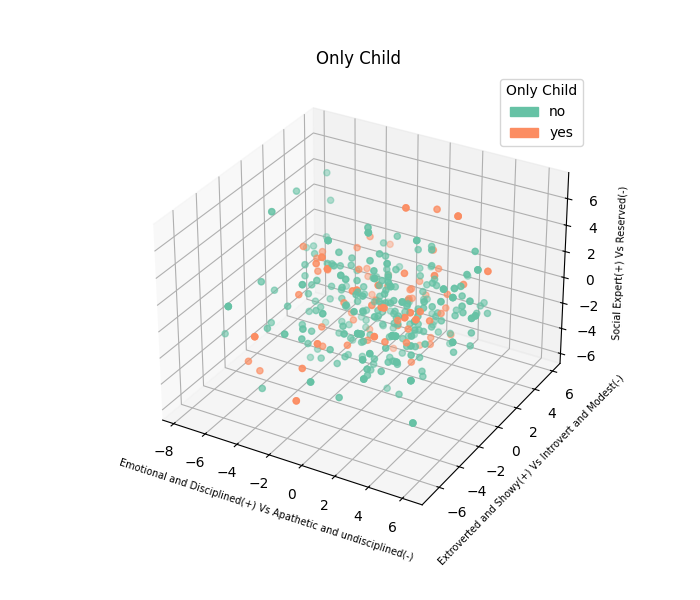

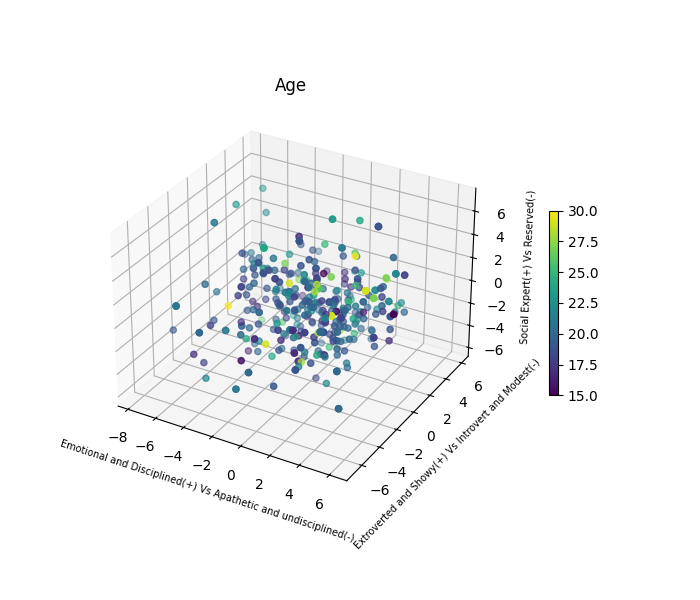

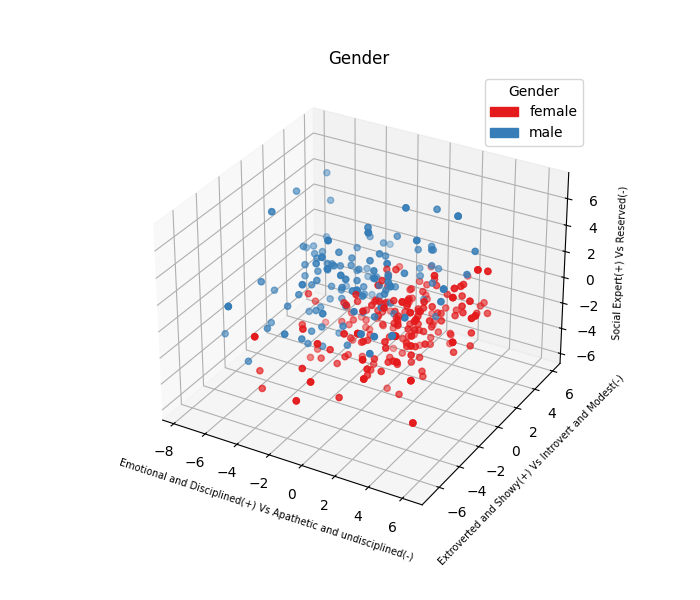

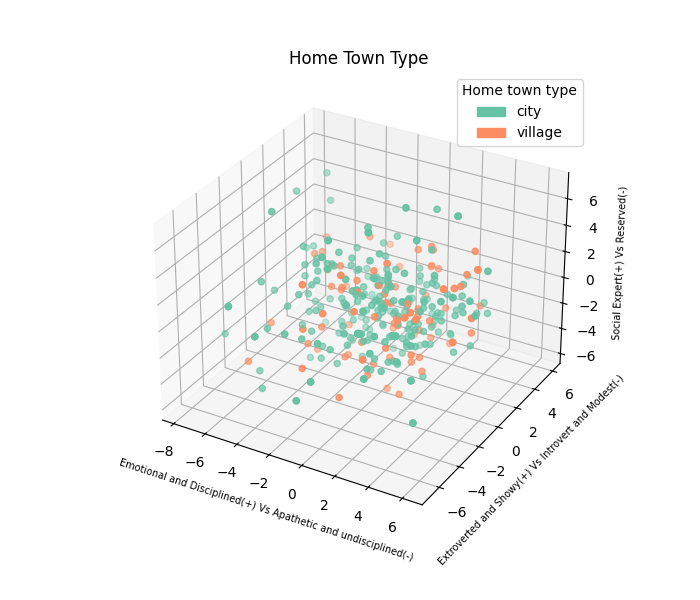

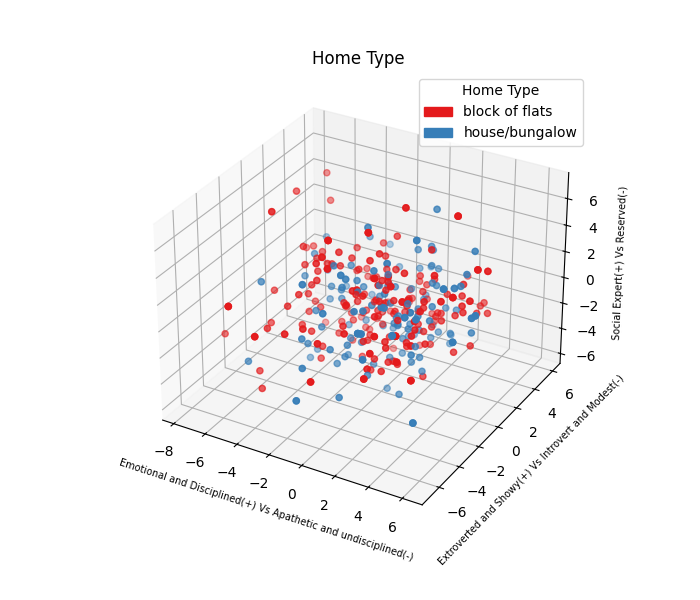

In [25]:
########Score_Graph_Xstd_df########

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
norm = Normalize(vmin=min(labels_train["Age"]), vmax=max(labels_train["Age"]))
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],c= labels_train['Age'].values)
axs.set_xlabel(pcsStd_names[0], fontsize= 7)
axs.set_ylabel(pcsStd_names[1], fontsize= 7)
axs.set_zlabel(pcsStd_names[2],fontsize= 7)
plt.colorbar(ScalarMappable(norm = norm, cmap = cm.viridis), ax = axs, shrink = 0.4, pad = 0.1)
plt.title('Age')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],c= [gender_col[gender] for gender in labels_train['Gender']])
axs.set_xlabel(pcsStd_names[0],fontsize= 7)
axs.set_ylabel(pcsStd_names[1],fontsize= 7)
axs.set_zlabel(pcsStd_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=gender) for gender, color in gender_col.items()]
axs.legend(handles= legend_patches, title= 'Gender')
plt.title('Gender')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],c= [Home_town_types_col[htt] for htt in labels_train['Home Town Type']])
axs.set_xlabel(pcsStd_names[0],fontsize= 7)
axs.set_ylabel(pcsStd_names[1],fontsize= 7)
axs.set_zlabel(pcsStd_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=Home_Town_Type) for Home_Town_Type, color in Home_town_types_col.items()]
axs.legend(handles= legend_patches, title = 'Home town type')
plt.title('Home Town Type')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2], c= [Home_type_col[ht] for ht in labels_train['Home Type']])
axs.set_xlabel(pcsStd_names[0],fontsize= 7)
axs.set_ylabel(pcsStd_names[1],fontsize= 7)
axs.set_zlabel(pcsStd_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=Home_Type) for Home_Type, color in Home_type_col.items()]
axs.legend(handles= legend_patches, title = 'Home Type')
plt.title('Home Type')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],c= [Only_child_col[oc] for oc in labels_train['Only child']])
axs.set_xlabel(pcsStd_names[0],fontsize= 7)
axs.set_ylabel(pcsStd_names[1],fontsize= 7)
axs.set_zlabel(pcsStd_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=Only_Child) for Only_Child, color in Only_child_col.items()]
axs.legend(handles= legend_patches, title = 'Only Child')
plt.title('Only Child')

plt.show()

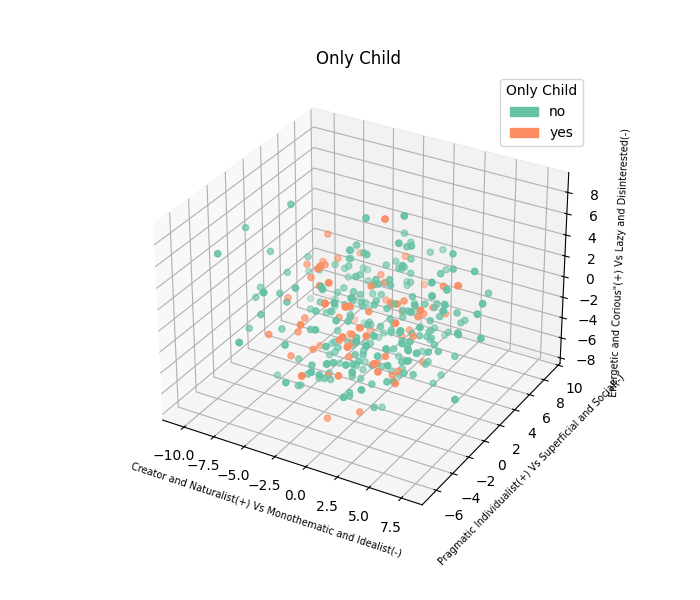

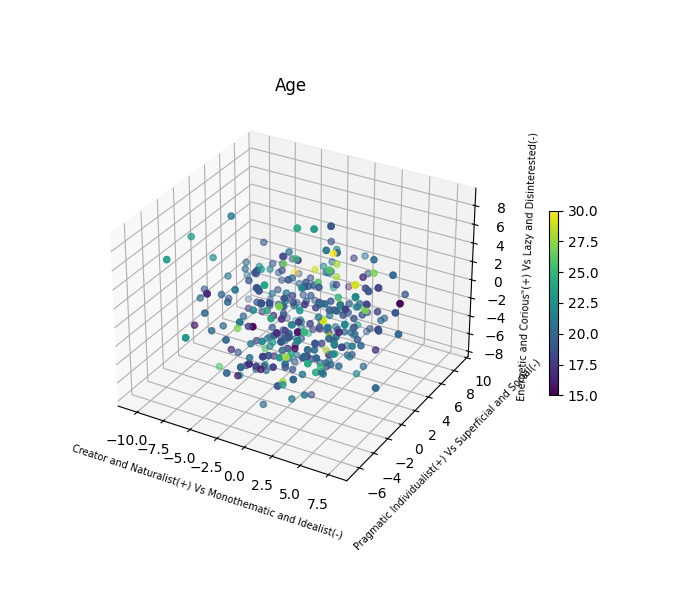

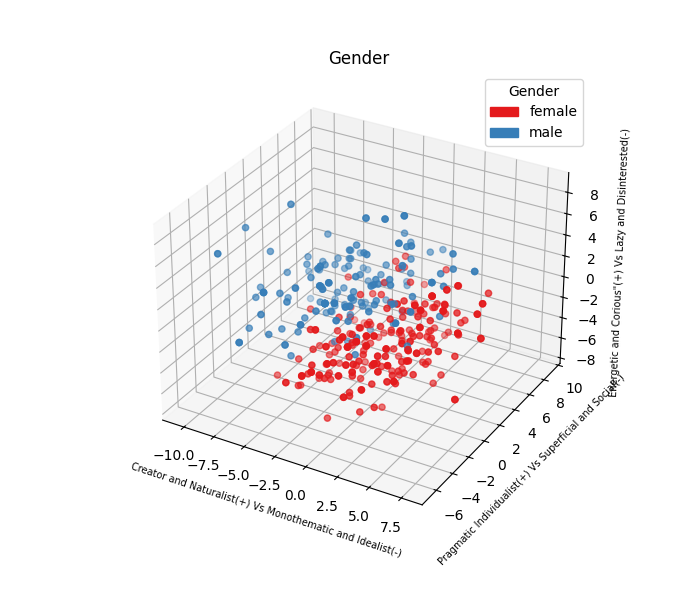

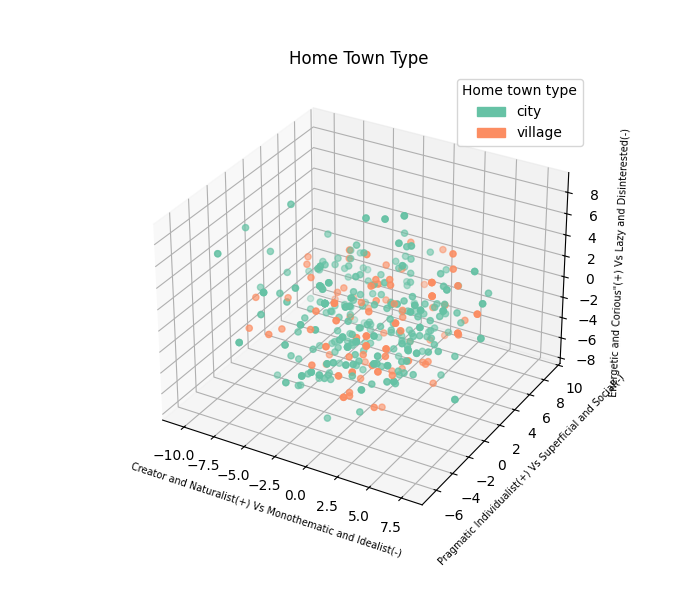

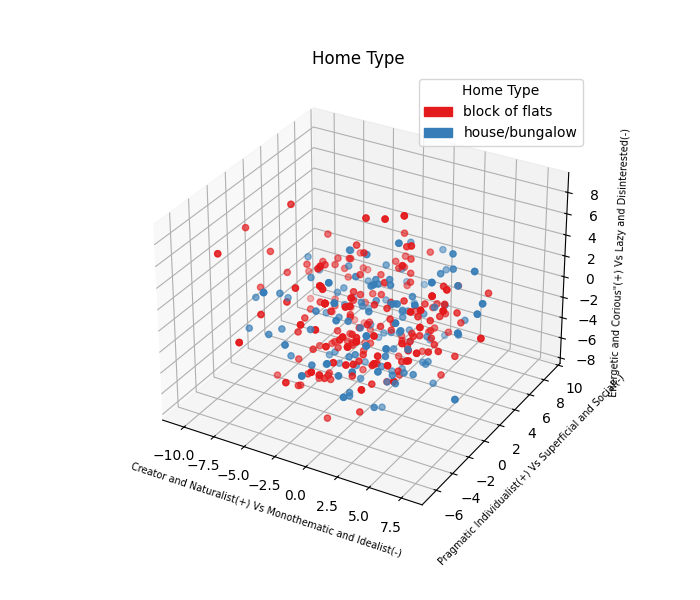

In [26]:
########Score_Graph_Xmm_df########

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
norm = Normalize(vmin=min(labels_train["Age"]), vmax=max(labels_train["Age"]))
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],c= labels_train['Age'].values)
axs.set_xlabel(pcsMinmax_names[0], fontsize= 7)
axs.set_ylabel(pcsMinmax_names[1], fontsize= 7)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 7)
plt.colorbar(ScalarMappable(norm = norm, cmap = cm.viridis), ax = axs, shrink = 0.4, pad = 0.1)
plt.title('Age')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],c= [gender_col[gender] for gender in labels_train['Gender']])
axs.set_xlabel(pcsMinmax_names[0],fontsize= 7)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 7)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=gender) for gender, color in gender_col.items()]
axs.legend(handles= legend_patches, title= 'Gender')
plt.title('Gender')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],c= [Home_town_types_col[htt] for htt in labels_train['Home Town Type']])
axs.set_xlabel(pcsMinmax_names[0],fontsize= 7)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 7)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=Home_Town_Type) for Home_Town_Type, color in Home_town_types_col.items()]
axs.legend(handles= legend_patches, title = 'Home town type')
plt.title('Home Town Type')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2], c= [Home_type_col[ht] for ht in labels_train['Home Type']])
axs.set_xlabel(pcsMinmax_names[0],fontsize= 7)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 7)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=Home_Type) for Home_Type, color in Home_type_col.items()]
axs.legend(handles= legend_patches, title = 'Home Type')
plt.title('Home Type')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,6),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],c= [Only_child_col[oc] for oc in labels_train['Only child']])
axs.set_xlabel(pcsMinmax_names[0],fontsize= 7)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 7)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 7)
legend_patches = [mpatches.Patch(color=color, label=Only_Child) for Only_Child, color in Only_child_col.items()]
axs.legend(handles= legend_patches, title = 'Only Child')
plt.title('Only Child')

plt.show()

As We can see, both scatter plots (for the Xstd and Xmm) are not able to distinguish labels data within principal components that we have just found. Actually, there is no correlation between labels and features We used for dimensionality reduction, so to define principal components; indeed, the ability to distinguish labels is just telling us that the way how principal components descibe feauters is coherent with labels. In this case we can not be able to make assumption and reason may be concern the reduced number of PCs, because we are using just 3 out of 5, so could be that 2 ot PCs remaining outside of the plot, are crucial to create a right separation of labels within data. 
In more details, we can say that it is not given that first three components are explaining relevant variance to distinguish labels; indeed PCs are ranked due esxplain maximum variance but it is not known if this is the important one to understand labels differences. Addictioning, we can say that featurs are not strictly correlated with labels.

However, even if We were able to plot in a 5 dimensions, We should focus on the cumulative variances that 5 PCs are able to explain. Reminding graphs plotted above, 5 PCs are able to explain around 30% of cumulative explained variance; therefore could be reasonable to think that amount is not sufficient to create distinguishment among data.

Consideration are made up for both cases, standard scaling and min max scaling.

## Exercise 4. $k$-Means

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), run the $k$-Means for clustering the data. In particular, **use the silohuette score for identify the best value for $k\in\{3, \ldots, 10\}$**.
2. Plot the score graphs of exercise 3.3, adding the centroids of the cluster.
3. Observing the centroids coordinates in the PC space, **give a name/interpretation to them**, exploiting the names you assigned to the PCs. **Comment and motivate your interpretations**.

In [27]:
##########K-MEANS Xstd##########

#Try and find best k values
Sil_Score= {}
best_score= 0
best_n_cluster= 0
for i in range(3,11):
    km_Xstd= KMeans(n_clusters=i, random_state= random_seed)
    prediction= km_Xstd.fit_predict(Y_stscale)
    score= silhouette_score(Y_stscale, prediction)
    Sil_Score[i]= score
    if score > best_score:
        best_score= score
        best_n_cluster= i

print(f'Result achived within several numers of clusters:')

for key,value in Sil_Score.items():
    print(f'Silouhette Score of {key} clasters: {value}')

print()
print(f'Best result: {best_score}, obtained with {best_n_cluster} clusters')

km_Xstd= KMeans(n_clusters=10, random_state= random_seed)
fitted_Xstd =km_Xstd.fit_predict(Y_stscale)


Result achived within several numers of clusters:
Silouhette Score of 3 clasters: 0.17391092241964698
Silouhette Score of 4 clasters: 0.1759736794563329
Silouhette Score of 5 clasters: 0.16500925652237172
Silouhette Score of 6 clasters: 0.16824015588614727
Silouhette Score of 7 clasters: 0.17358773184143536
Silouhette Score of 8 clasters: 0.1803250946109334
Silouhette Score of 9 clasters: 0.17911482815255972
Silouhette Score of 10 clasters: 0.18363358459839169

Best result: 0.18363358459839169, obtained with 10 clusters


In [28]:
##########K-MEANS Xmm##########

#Try and find best k values
Sil_Score_mm= {}
best_score_mm= 0
best_n_cluster_mm= 0
for i in range(3,11):
    km_Xmm= KMeans(n_clusters=i, random_state= random_seed)
    prediction_mm= km_Xmm.fit_predict(Y_minmaxscale)
    score_mm= silhouette_score(Y_minmaxscale, prediction)
    Sil_Score_mm[i]= score_mm
    if score_mm > best_score_mm:
        best_score_mm= score_mm
        best_n_cluster_mm= i

print(f'Result achived within several numers of clusters:')

for key,value in Sil_Score_mm.items():
    print(f'Silouhette Score of {key} clasters: {value}')

print()
print(f'Best result: {best_score_mm}, obtained with {best_n_cluster_mm} clusters')

km_Xmm= KMeans(n_clusters=3, random_state= random_seed)
fitted_Xmm = km_Xmm.fit_predict(Y_minmaxscale)

Result achived within several numers of clusters:
Silouhette Score of 3 clasters: 0.1691588858514919
Silouhette Score of 4 clasters: 0.1691588858514919
Silouhette Score of 5 clasters: 0.1691588858514919
Silouhette Score of 6 clasters: 0.1691588858514919
Silouhette Score of 7 clasters: 0.1691588858514919
Silouhette Score of 8 clasters: 0.1691588858514919
Silouhette Score of 9 clasters: 0.1691588858514919
Silouhette Score of 10 clasters: 0.1691588858514919

Best result: 0.1691588858514919, obtained with 3 clusters


Here it is possible to observe that number of clusters is differing between two scaling methods. This difference is not really relevant, since it is possible to see that shilouette score is really similar betweeen these two. As a remind, shilouette score is a metric measuring performance of clustering (in this case Kmeans); ss evaluate distances between points with their centroids and compare it with distances with the other clusters, so the final value is rangied between -1 and 1. Actually, this is the key point. Since the two scalers are moving data in different ways, distances between data (i.e. centroids) are different scales of values. However, as said, it is important to notice that ss values are comparable and almost the same.

Scatter plot representation of Xstd_df with centroids


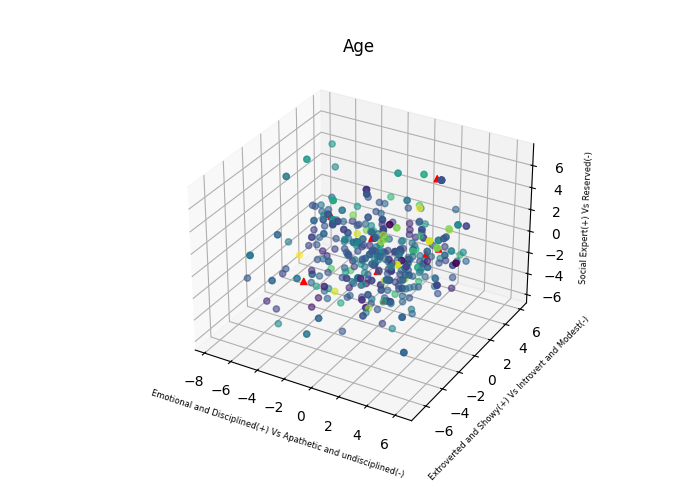

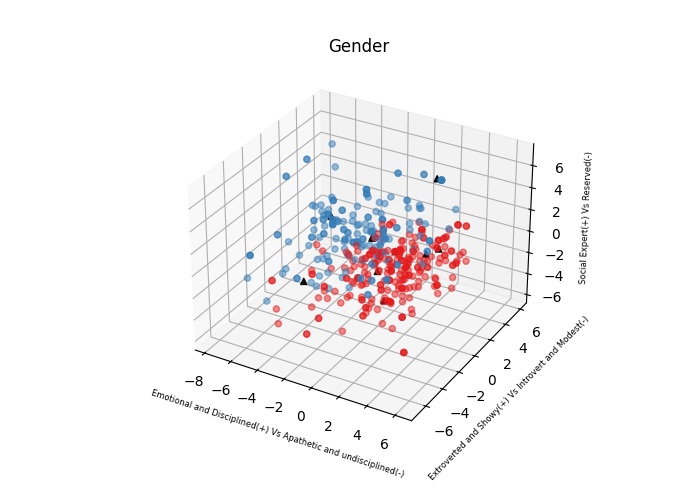

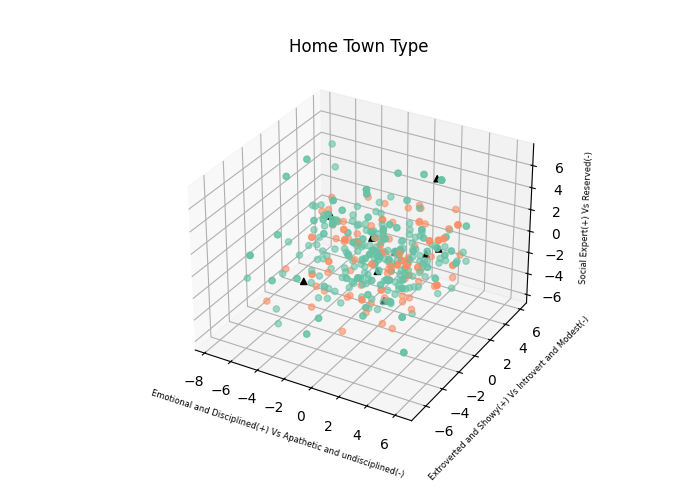

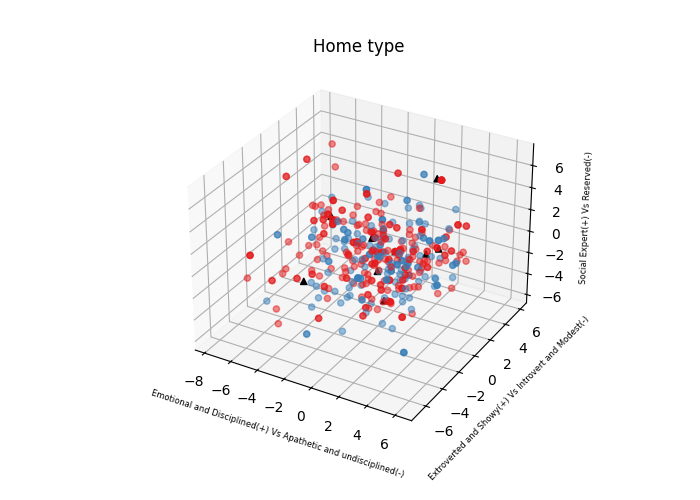

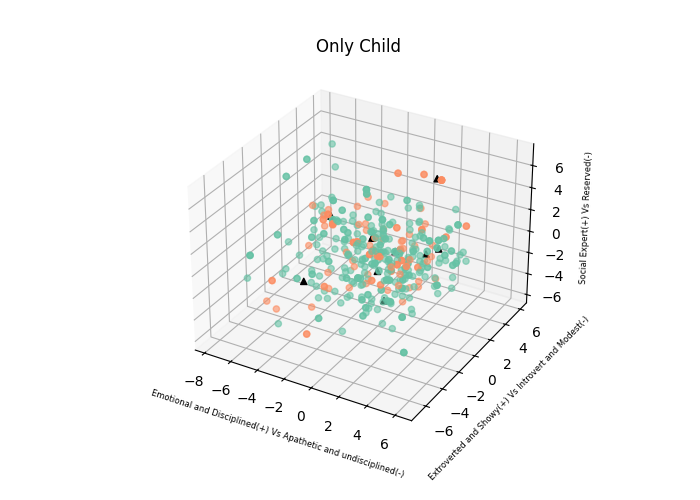

In [29]:
print(f'Scatter plot representation of Xstd_df with centroids')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],alpha= 0.6,c= labels_train['Age'].values)
axs.scatter(km_Xstd.cluster_centers_[:, 0], km_Xstd.cluster_centers_[:, 1], km_Xstd.cluster_centers_[:, 2], c='red', marker='^',alpha= 1)
axs.set_xlabel(pcsStd_names[0], fontsize= 6)
axs.set_ylabel(pcsStd_names[1], fontsize= 6)
axs.set_zlabel(pcsStd_names[2],fontsize= 6)
plt.title("Age")
plt.show()

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],alpha= 0.5,c= [gender_col[gender] for gender in labels_train['Gender']])
axs.scatter(km_Xstd.cluster_centers_[:, 0], km_Xstd.cluster_centers_[:, 1], km_Xstd.cluster_centers_[:, 2], c='black', marker='^',alpha= 0.9)
axs.set_xlabel(pcsStd_names[0],fontsize= 6)
axs.set_ylabel(pcsStd_names[1],fontsize= 6)
axs.set_zlabel(pcsStd_names[2],fontsize= 6)
plt.title('Gender')
plt.show()

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],alpha= 0.6,c= [Home_town_types_col[htt] for htt in labels_train['Home Town Type']])
axs.scatter(km_Xstd.cluster_centers_[:, 0], km_Xstd.cluster_centers_[:, 1], km_Xstd.cluster_centers_[:, 2], c='black', marker='^',alpha= 1)
axs.set_xlabel(pcsStd_names[0],fontsize= 6)
axs.set_ylabel(pcsStd_names[1],fontsize= 6)
axs.set_zlabel(pcsStd_names[2],fontsize= 6)
plt.title('Home Town Type')
plt.show()

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],alpha= 0.5,c= [Home_type_col[ht] for ht in labels_train['Home Type']])
axs.scatter(km_Xstd.cluster_centers_[:, 0], km_Xstd.cluster_centers_[:, 1], km_Xstd.cluster_centers_[:, 2], c='black', marker='^',alpha= 1)
axs.set_xlabel(pcsStd_names[0],fontsize= 6)
axs.set_ylabel(pcsStd_names[1],fontsize= 6)
axs.set_zlabel(pcsStd_names[2],fontsize= 6)
plt.title('Home type')
plt.show()

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_stscale[:, 0], Y_stscale[:, 1], Y_stscale[:, 2],alpha= 0.6,c= [Only_child_col[oc] for oc in labels_train['Only child']])
axs.scatter(km_Xstd.cluster_centers_[:, 0], km_Xstd.cluster_centers_[:, 1], km_Xstd.cluster_centers_[:, 2], c='black', marker='^',alpha= 1)
axs.set_xlabel(pcsStd_names[0],fontsize= 6)
axs.set_ylabel(pcsStd_names[1],fontsize= 6)
axs.set_zlabel(pcsStd_names[2],fontsize= 6)
plt.title('Only Child')
plt.show()

Scatter plot representation of Xmm_df with centroids


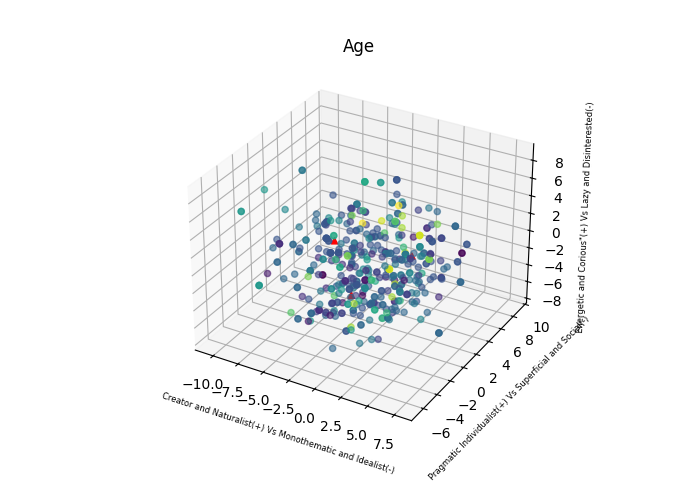

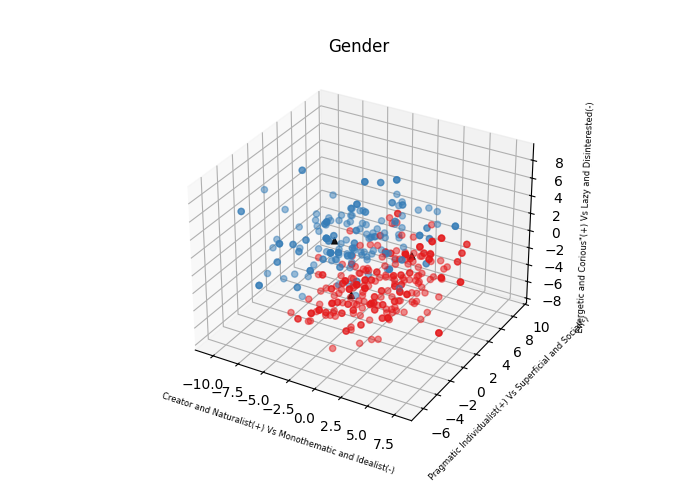

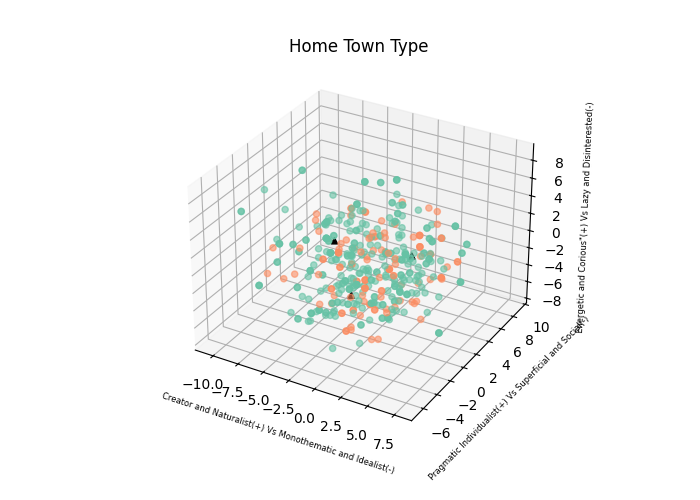

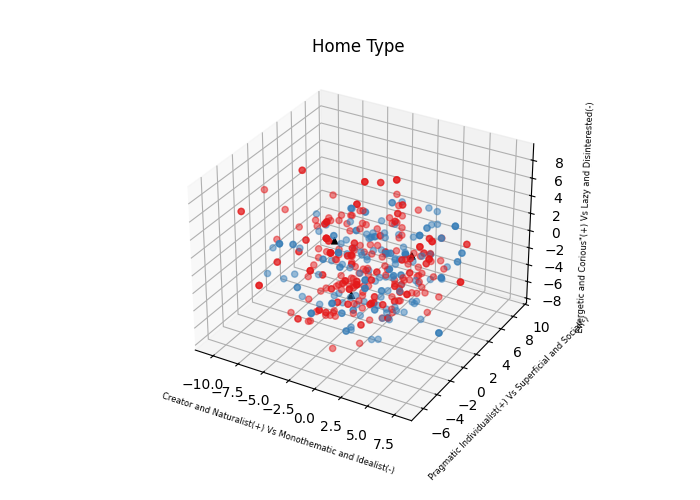

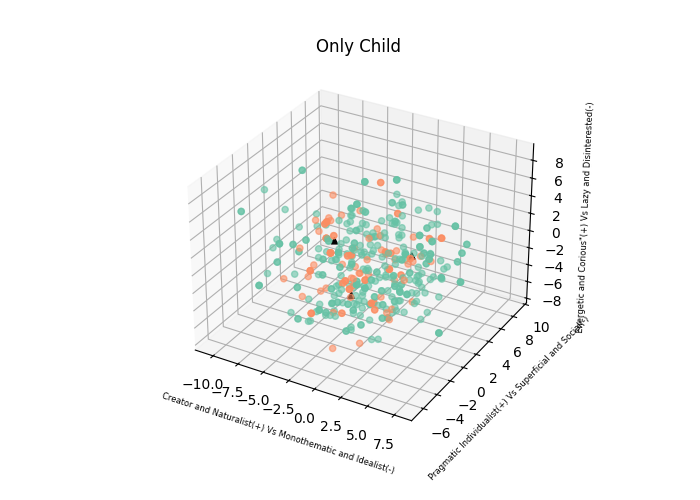

In [30]:
print(f'Scatter plot representation of Xmm_df with centroids')

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],alpha= 0.6,c= labels_train['Age'].values)
axs.scatter(km_Xmm.cluster_centers_[:, 0], km_Xmm.cluster_centers_[:, 1], km_Xmm.cluster_centers_[:, 2], c='red', marker='^',alpha= 1)
axs.set_xlabel(pcsMinmax_names[0], fontsize= 6)
axs.set_ylabel(pcsMinmax_names[1], fontsize= 6)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 6)
plt.title('Age')
plt.show()

cmap= cm.Set1.colors
cmap2= cm.Set2.colors

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],alpha= 0.5,c= [gender_col[gender] for gender in labels_train['Gender']])
axs.scatter(km_Xmm.cluster_centers_[:, 0], km_Xmm.cluster_centers_[:, 1], km_Xmm.cluster_centers_[:, 2], c='black', marker='^',alpha= 0.9)
axs.set_xlabel(pcsMinmax_names[0],fontsize= 6)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 6)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 6)
plt.title('Gender')
plt.show()


fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],alpha= 0.6,c= [Home_town_types_col[htt] for htt in labels_train['Home Town Type']])
axs.scatter(km_Xmm.cluster_centers_[:, 0], km_Xmm.cluster_centers_[:, 1], km_Xmm.cluster_centers_[:, 2], c='black', marker='^',alpha= 1)
axs.set_xlabel(pcsMinmax_names[0],fontsize= 6)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 6)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 6)
plt.title('Home Town Type')
plt.show()


fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2],alpha= 0.5,c= [Home_type_col[ht] for ht in labels_train['Home Type']])
axs.scatter(km_Xmm.cluster_centers_[:, 0], km_Xmm.cluster_centers_[:, 1], km_Xmm.cluster_centers_[:, 2], c='black', marker='^',alpha= 1)
axs.set_xlabel(pcsMinmax_names[0],fontsize= 6)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 6)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 6)
plt.title('Home Type')
plt.show()

fig_datasetscore, axs= plt.subplots(1, figsize=(7,5),subplot_kw= {'projection':'3d'})
axs.scatter(Y_minmaxscale[:, 0], Y_minmaxscale[:, 1], Y_minmaxscale[:, 2], alpha= 0.6,c= [Only_child_col[oc] for oc in labels_train['Only child']])
axs.scatter(km_Xmm.cluster_centers_[:, 0], km_Xmm.cluster_centers_[:, 1], km_Xmm.cluster_centers_[:, 2], c='black', marker='^',alpha= 1)
axs.set_xlabel(pcsMinmax_names[0],fontsize= 6)
axs.set_ylabel(pcsMinmax_names[1],fontsize= 6)
axs.set_zlabel(pcsMinmax_names[2],fontsize= 6)
plt.title('Only Child')
plt.show()

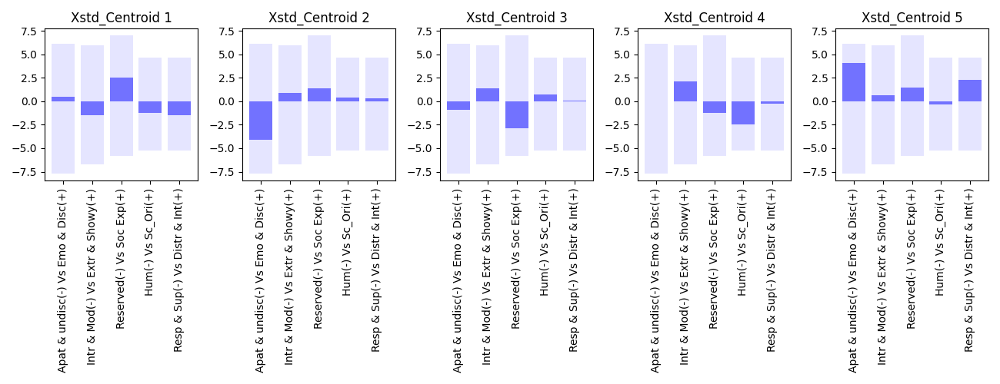

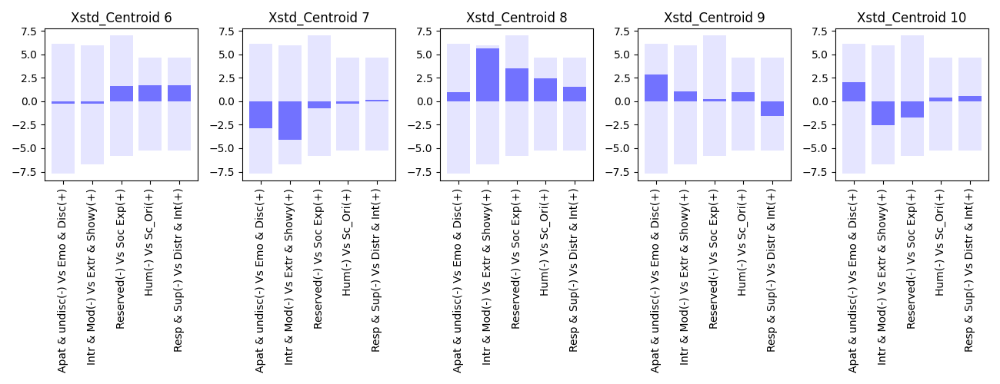

In [31]:
max_km_Xstd= Y_stscale.max(axis= 0)         #max value along PCs
min_km_Xstd= Y_stscale.min(axis= 0)         #min valye along PCs

fig,axs= plt.subplots(1,5, figsize= (13,5))
axs[0].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[0].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[0].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[0,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[0].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[0].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[0].set_title('Xstd_Centroid 1')
plt.tight_layout()

axs[1].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[1].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[1].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[1,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[1].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[1].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[1].set_title('Xstd_Centroid 2')
plt.tight_layout()

axs[2].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[2].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[2].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[2,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[2].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[2].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[2].set_title('Xstd_Centroid 3')
plt.tight_layout()

axs[3].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[3].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[3].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[3,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[3].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[3].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[3].set_title('Xstd_Centroid 4')
plt.tight_layout()

axs[4].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[4].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[4].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[4,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[4].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[4].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[4].set_title('Xstd_Centroid 5')
plt.tight_layout()



fig,axs= plt.subplots(1,5, figsize= (13,5))
axs[0].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[0].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[0].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[5,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[0].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[0].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[0].set_title('Xstd_Centroid 6')
plt.tight_layout()

axs[1].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[1].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[1].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[6,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[1].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[1].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[1].set_title('Xstd_Centroid 7')
plt.tight_layout()

axs[2].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[2].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[2].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[7,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[2].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[2].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[2].set_title('Xstd_Centroid 8')
plt.tight_layout()

axs[3].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[3].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[3].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[8,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[3].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[3].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'], 
                       rotation=90)
axs[3].set_title('Xstd_Centroid 9')
plt.tight_layout()

axs[4].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), max_km_Xstd, color= 'blue', alpha= 0.1)
axs[4].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), min_km_Xstd, color= 'blue', alpha= 0.1)
axs[4].bar(np.arange(km_Xstd.cluster_centers_.shape[1]), km_Xstd.cluster_centers_[9,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[4].set_xticks(ticks=np.arange(km_Xstd.cluster_centers_.shape[1]))
axs[4].set_xticklabels(labels=['Apat & undisc(-) Vs Emo & Disc(+)', 'Intr & Mod(-) Vs Extr & Showy(+)','Reserved(-) Vs Soc Exp(+)','Hum(-) Vs Sc_Ori(+)','Resp & Sup(-) Vs Distr & Int(+)'],
                       rotation=90)
axs[4].set_title('Xstd_Centroid 10')
plt.tight_layout()

The centroids are points in the m dimensional space which cordinates are expresed by PCs and We can see them throught Barplots above. Indeed, after applied the PCA, our data are projected in the new space created by the first m (m=5) components. Next We applied the k-means which try to create clusters among data in the new space. For each cluster, it is possible to compute a centroid that is, by definition, the sum of the osservations belongs to the cluster, normalized by the cardinality of the cluster.

Recalling the name of PCs:
- PC1: Emotional and Disciplined(+) Vs Apathetic and undisciplined(-)
- PC2: Extroverted and Showy(+) Vs Introvert and Modest(-)
- PC3: Social Expert(+) Vs Reserved(-)
- PC4: Science-Oriented(+) Vs Humanist(-)
- PC5: Distracted and Intellectual(+) Vs Responsable and Superficial(-)


We make an interpretation of Centroids:

- CENTROID 1:
In the first centroid we have a cluster who is tryng to group of people that is "Social Expert" mostly, "Introvert and Modest", "Humanist" and "Responsable and Superficial", while the contribute from the first PC is negligible.
For this reason We can summarize the name of the centroid as "Strategic and Realists" as people who is able to move in society avoding situations in which they are not confidents due their introvert characteristic. Also Realists since they are more focused in humanistcs aspects.
Also, the name of the cluster should be influensed by the most increased PC, so for the third one which is increasing in Social Expert(+) and this can suggest that cluster contains people who basically are Experts in society rules. 

- CENTROID 2:
We can clearly identify aim of the centroid as center of gravity of the cluster. In this case there is a dominant PC that is the firts one in negative direction "Apathetic and Udisciplined" combined with nexts two PCs in "Extroverted and Showy","Social Expert". Since We should focus more in the first PC We can say thta cluster contains people who is usual to have fun due to Extroversy and Social Experience, but probably this yelds to Apathy. So We can call the centroid as "Bored" to reflects necessity to find and try new experiences.

- CENTROID 3:
In the third cluster We have conflicts between Extroversy and Confidentiality (People who are reserved) so We can think about a person that is reserved with strangers while is more available to be kind with firends. So the name of the centroid could be "Selectors of friends" reflecting also a science-oriented mind.

- CENTROID 4:
The fourth cluster is goruping people who as a strong social oriention, according with PCs, so a possible name of the fourth centroid could be "Social". 

- CENTROID 5: 
According with positive directions of all PCs, We notice an extremely high orientation to "Emotional & Disciplined" so the cluster probably would contains "Emotional" (Name of the centroid) people, according also with attitude in intecllectual fields.

- CENTROID 6:
In this cluster We probably see people who is oriented in intellectuals habits (like in reading, studying), mostly in scientific fields. Also, they are expert in society, so a possible name of the centroid could be "Scientists".

- CLUSTER 7:
In this cluster, two main PCs are dominant, the first and the second one, both in negative direction. So, since people here are Apathetic and introverted, a possible name for the centroid could be "Sad" as people who are caged by their inroversion.

- CLUSTER 8:
Main characters of people in this cluster are Social Experience and Extroversy and Showyty, so a possible name of the centroid could be "Exibitionists", according to their capacity to apply scientistic mind to be able to understand on how to entertain people.

- CLUSTER 9:
In this cluster, people are described by mainly positive and negative directions of first and last PC, respectively . So we can named the centroid as "Disciplined" as Disciplined and Responsable people, who know what is a good behaviour due to social experiens and how to reach it with scientific mind.

- CLUSTER 10:
People in this cluster are Introvert, Emotional and Reserved, so We can summirize this cluster naming it's centroid as "Loners"

In [32]:
Clusternames_Std= ["Strategic and Realists","Apathetic and Udisciplined","Selectors of friends","Social","Emotional","Scientists","Sad","Exibitionists","Disciplined","Loners"]

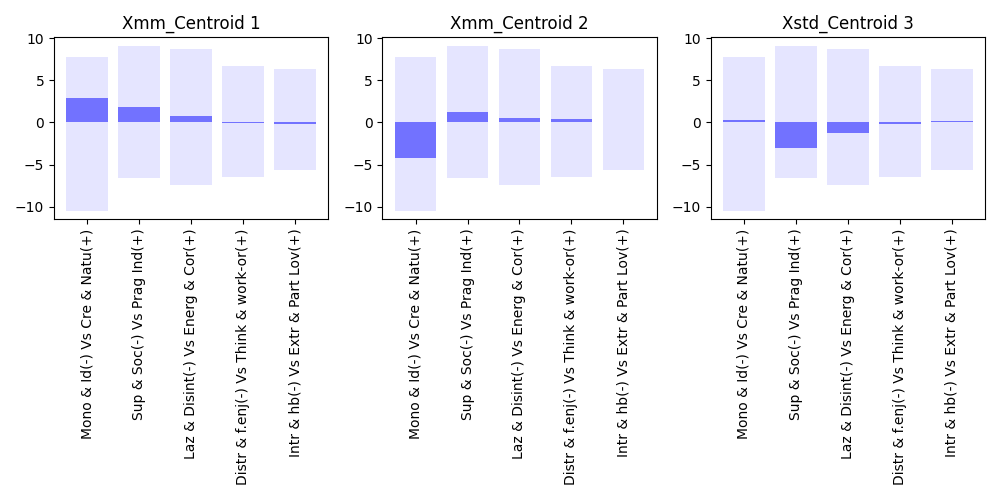

In [33]:
max_km_Xmm= Y_minmaxscale.max(axis= 0)         #max value along PCs
min_km_Xmm= Y_minmaxscale.min(axis= 0)         #min valye along PCs

fig,axs= plt.subplots(1,3, figsize= (10,5))
axs[0].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), max_km_Xmm, color= 'blue', alpha= 0.1)
axs[0].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), min_km_Xmm, color= 'blue', alpha= 0.1)
axs[0].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), km_Xmm.cluster_centers_[0,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[0].set_xticks(ticks=np.arange(km_Xmm.cluster_centers_.shape[1]))
axs[0].set_xticklabels(labels=['Mono & Id(-) Vs Cre & Natu(+)','Sup & Soc(-) Vs Prag Ind(+)','Laz & Disint(-) Vs Energ & Cor(+)','Distr & f.enj(-) Vs Think & work-or(+)','Intr & hb(-) Vs Extr & Part Lov(+)'], 
                       rotation=90)
axs[0].set_title('Xmm_Centroid 1')
plt.tight_layout()

axs[1].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), max_km_Xmm, color= 'blue', alpha= 0.1)
axs[1].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), min_km_Xmm, color= 'blue', alpha= 0.1)
axs[1].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), km_Xmm.cluster_centers_[1,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[1].set_xticks(ticks=np.arange(km_Xmm.cluster_centers_.shape[1]))
axs[1].set_xticklabels(labels=['Mono & Id(-) Vs Cre & Natu(+)','Sup & Soc(-) Vs Prag Ind(+)','Laz & Disint(-) Vs Energ & Cor(+)','Distr & f.enj(-) Vs Think & work-or(+)','Intr & hb(-) Vs Extr & Part Lov(+)'], 
                       rotation=90)
axs[1].set_title('Xmm_Centroid 2')
plt.tight_layout()

axs[2].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), max_km_Xmm, color= 'blue', alpha= 0.1)
axs[2].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), min_km_Xmm, color= 'blue', alpha= 0.1)
axs[2].bar(np.arange(km_Xmm.cluster_centers_.shape[1]), km_Xmm.cluster_centers_[2,:], color= 'blue', alpha= 0.5)              #Plot centroids values w.t.r. first PC
axs[2].set_xticks(ticks=np.arange(km_Xmm.cluster_centers_.shape[1]))
axs[2].set_xticklabels(labels=['Mono & Id(-) Vs Cre & Natu(+)','Sup & Soc(-) Vs Prag Ind(+)','Laz & Disint(-) Vs Energ & Cor(+)','Distr & f.enj(-) Vs Think & work-or(+)','Intr & hb(-) Vs Extr & Part Lov(+)'], 
                       rotation=90)
axs[2].set_title('Xstd_Centroid 3')
plt.tight_layout()
plt.show()

Recalling the name of PCs:
- PC1: Creator and Naturalist(+) Vs Monothematic and Idealist(-)
- PC2: Pragmatic Individualist(+) Vs Superficial and Social(-)
- PC3: Energetic and Corious(+) Vs Lazy and Disinterested(-)
- PC4: Thinker and work-oriented(+) Vs Distract and fun enjoyer(-)
- PC5: Extroverted and Party Lover(+) Vs Introvert and homebody(-)

Follow an interpretation of Centroids.

- Centroid 1:
In the firts cluster We see people how are creative, who like to work alone with their pragmaticity and they are energetic and courious. So a possible name of the centroid could be "Genious" as summarize every aspect of geniality.

- Centroid 2:
Since contribute of other PCs next to the second one are negligible, We can say that in this cluster fall people who are Monothematic and Individualist. So a possible name of the second centroid could be "Habitualist"

- Centroid 3:
In this cluster We have people who are lazy and social oriented with superficiality. So a possible name of the centroid could be "Influenceable" as people driven by social trends and lazyness inducted by the use of social networks. Also they are superficial so, it is possible that the emptyness of own questions could be a reason to their influenceableness. 

In [34]:
Clusternames_Xmm= ["Genious","Habitualist","Influenceable"]

## Exercise 5. Cluster Evaluations

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), perform an **external evaluation** of the clustering obtained at exercise 4.1 with respect to one or more labels in the list _labels_. **Comment the results, comparing the evaluation with the interpretation you gave at exercise 4.3**. 
2. For each one of the two datasets (_std_ and _mm_), perform an **internal evaluation** of each cluster, with respect to the silohuette score. **Comment the results**. 

In [35]:
clusters_Xstd = km_Xstd.fit_predict(Y_stscale)
clusters_Xmm = km_Xmm.fit_predict(Y_minmaxscale)

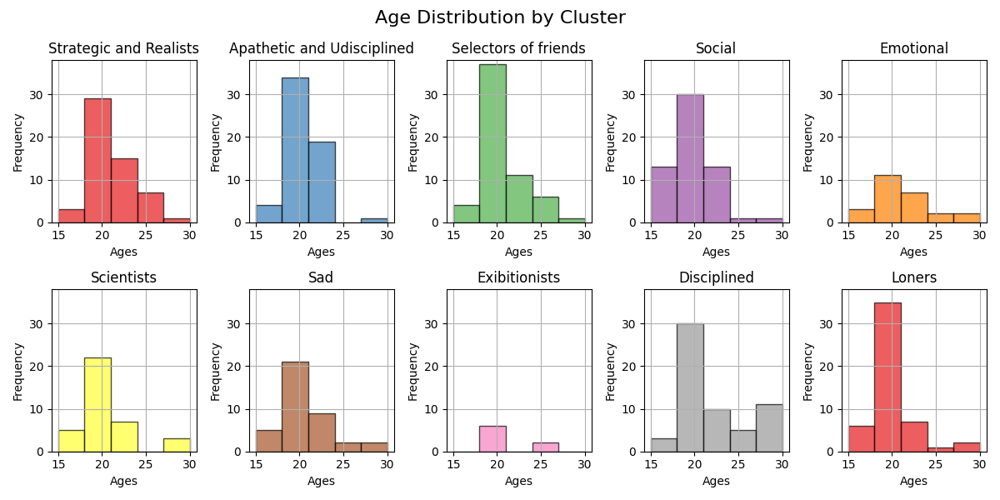

In [36]:
# Bins are ranges of ages
num_bins = 6
bins = np.linspace(min(labels_train["Age"]), max(labels_train["Age"]), num=num_bins)
age_labels_df = pd.DataFrame({"std": clusters_Xstd, "mm": clusters_Xmm, "age": labels_train["Age"]})

fig, ax = plt.subplots(2, 5, figsize=(12, 6))
ax = ax.flatten()
colors = plt.cm.Set1.colors

# Find max value of frequency to uniform histogram scale
max_count = 0
for i in range(10):
    cluster_data = age_labels_df.loc[age_labels_df["std"] == i, "age"]
    counts, _ = np.histogram(cluster_data, bins=bins)
    max_count = max(max_count, max(counts))

for i in range(10):
    cluster_data = age_labels_df.loc[age_labels_df["std"] == i, "age"]
    ax[i].hist(cluster_data, bins=bins, color=colors[i % len(colors)], edgecolor='black', alpha=0.7)
    ax[i].set_title(Clusternames_Std[i])
    ax[i].set_xlabel("Ages")
    ax[i].set_ylabel("Frequency")
    ax[i].grid()
    ax[i].set_ylim(0,max_count+1)

fig.suptitle("Age Distribution by Cluster", fontsize=16)
plt.tight_layout()
plt.show()


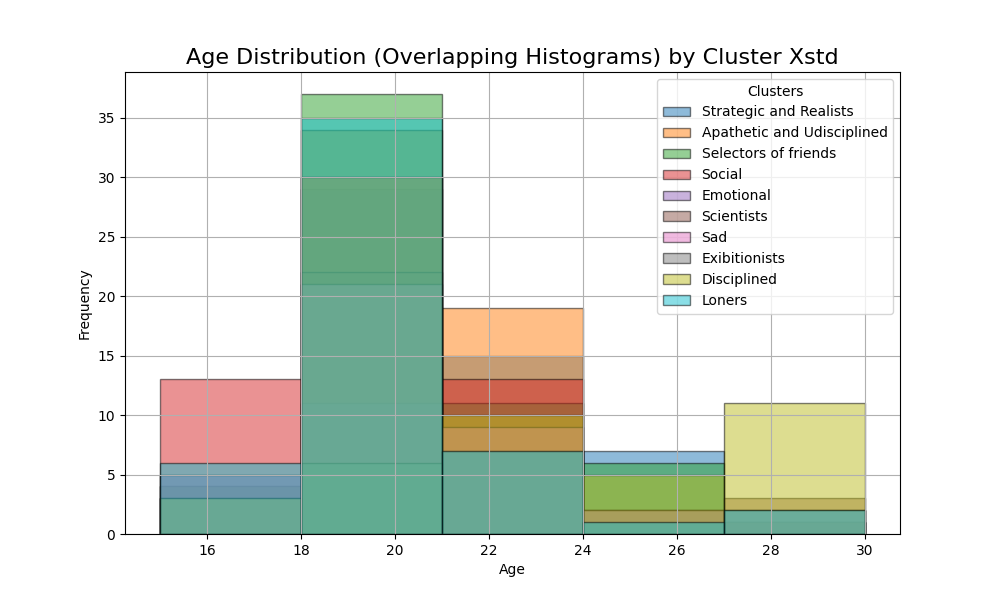

In [37]:
colors_s = plt.cm.tab10

plt.figure(figsize=(10,6))
for i in range(10):
    cluster_data = age_labels_df.loc[age_labels_df["std"] == i, "age"]
    plt.hist(cluster_data, bins=bins, color= colors_s(i), 
             edgecolor='black', alpha=0.5, label=Clusternames_Std[i])

# Aggiunta della legenda
plt.legend(title="Clusters", loc="upper right", fontsize=10)

# Aggiunta di titolo ed etichette
plt.title("Age Distribution (Overlapping Histograms) by Cluster Xstd", fontsize=16)
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.grid()

# Mostra il grafico
plt.show()

It is possible to observe that each cluster has higher frequncy in a specific range of ages (i.e.18,21) and thi suggest that dataset contains more values belonging in this range. Also, it is evident that some clusters are clustering more data between others and this could be a possible reason to use less clusters. Expecially for "Exhibitionists", the numebr of data falling in thi cluster are preatty lowm showing that this cluster is not clustering correctely: probably woul be better to dropp of it.

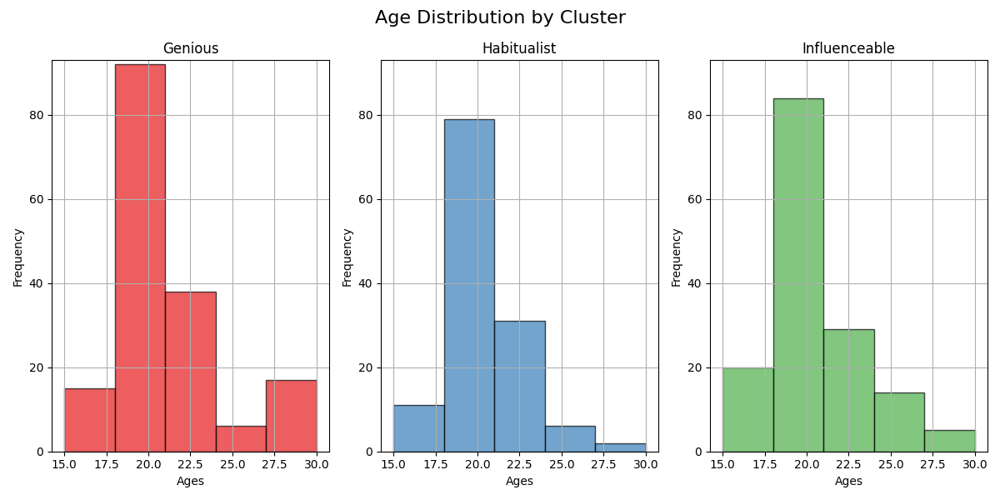

In [38]:
fig, ax = plt.subplots(1, 3, figsize=(12, 6))
ax = ax.flatten()

# Find max value of frequency to uniform histogram scale
max_count = 0
for i in range(3):
    cluster_data = age_labels_df.loc[age_labels_df["mm"] == i, "age"]
    counts, _ = np.histogram(cluster_data, bins=bins)
    max_count = max(max_count, max(counts))

for i in range(3):
    cluster_data = age_labels_df.loc[age_labels_df["mm"] == i, "age"]
    ax[i].hist(cluster_data, bins=bins, color=colors[i % len(colors)], edgecolor='black', alpha=0.7)
    ax[i].set_title(Clusternames_Xmm[i])
    ax[i].set_xlabel("Ages")
    ax[i].set_ylabel("Frequency")
    ax[i].grid()
    ax[i].set_ylim(0,max_count+1)

fig.suptitle("Age Distribution by Cluster", fontsize=16)
plt.tight_layout()
plt.show()

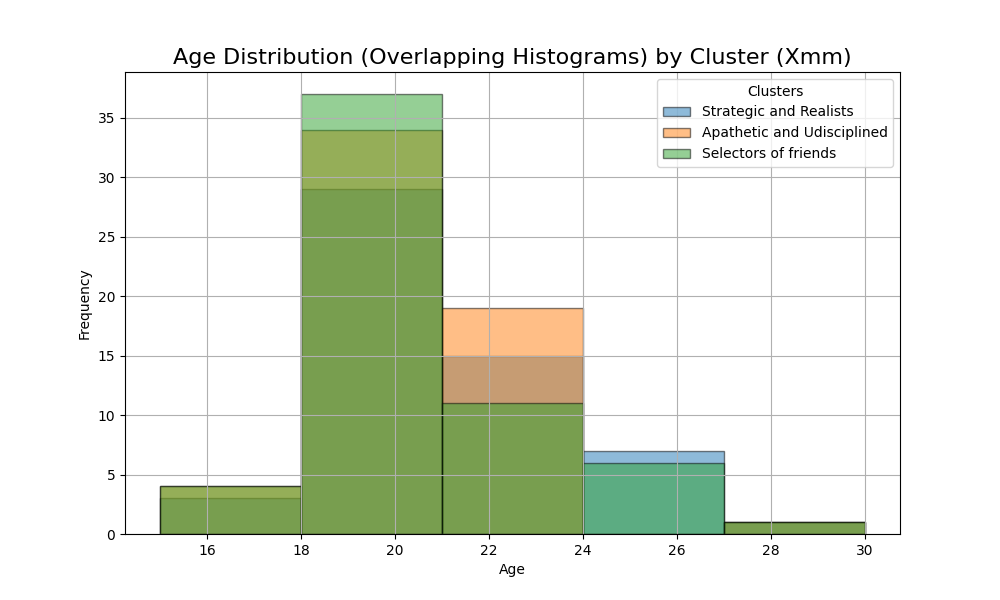

In [39]:
plt.figure(figsize=(10,6))
for i in range(3):
    cluster_data = age_labels_df.loc[age_labels_df["std"] == i, "age"]
    plt.hist(cluster_data, bins=bins, color= colors_s(i), 
             edgecolor='black', alpha=0.5, label=Clusternames_Std[i])

# Aggiunta della legenda
plt.legend(title="Clusters", loc="upper right", fontsize=10)

# Aggiunta di titolo ed etichette
plt.title("Age Distribution (Overlapping Histograms) by Cluster (Xmm)", fontsize=16)
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.grid()

# Mostra il grafico
plt.show()

Also in the case of min max scaled dataset, still evident that age is not a good target label to make clusters perform, since PCA reduction (with m = 5 components) is not able to predict correctely this label. So, considerations are no satisfactory.

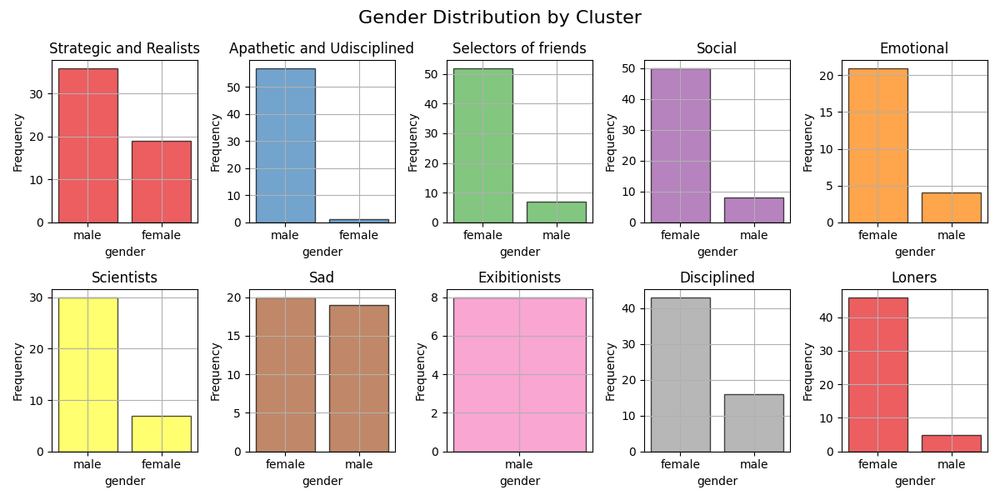

In [40]:
gender_df = pd.DataFrame({"std": clusters_Xstd, "mm": clusters_Xmm, "gender": labels_train["Gender"]})

fig, ax = plt.subplots(2, 5, figsize=(12, 6))
ax = ax.flatten()
colors = plt.cm.Set1.colors

for i in range(10):
    cluster_data = gender_df.loc[gender_df["std"] == i, "gender"].value_counts()
    ax[i].bar(cluster_data.index,cluster_data.values, color=colors[i % len(colors)], edgecolor='black', alpha=0.7)
    ax[i].set_title(Clusternames_Std[i])
    ax[i].set_xlabel("gender")
    ax[i].set_ylabel("Frequency")
    ax[i].grid()

fig.suptitle("Gender Distribution by Cluster", fontsize=16)
plt.tight_layout()
plt.show()

This plot is extremely satisfactory since it is showing power of clustering applied in PCA reduction. As we can see, clusters are correscly distinguishing gender in ost of cases. Indeed, it is howing ho social, friends selection and enotions are more related with female gender, meanwhile science lack of emotions (apathetic) is most common in male gender.

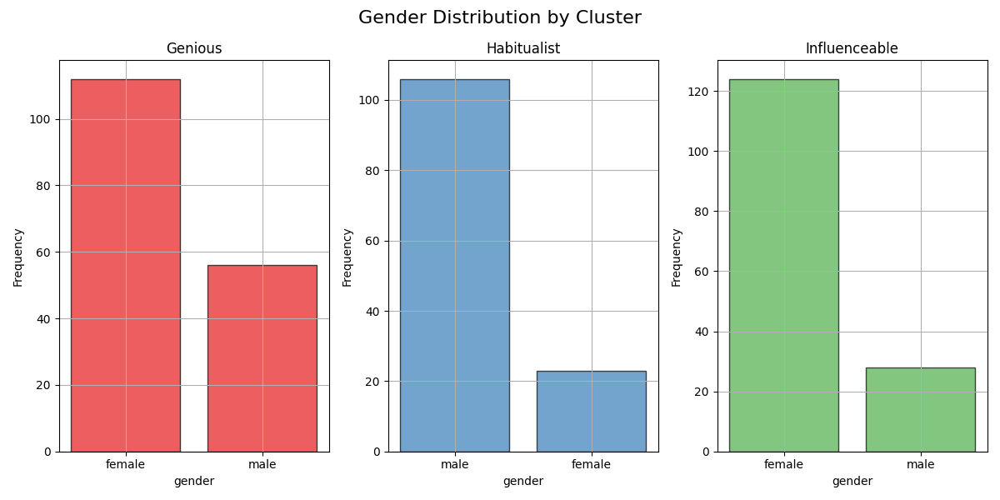

In [41]:
gender_df = pd.DataFrame({"std": clusters_Xstd, "mm": clusters_Xmm, "gender": labels_train["Gender"]})

fig, ax = plt.subplots(1, 3, figsize=(12, 6))
ax = ax.flatten()
colors = plt.cm.Set1.colors

for i in range(3):
    cluster_data = gender_df.loc[gender_df["mm"] == i, "gender"].value_counts()
    ax[i].bar(cluster_data.index,cluster_data.values, color=colors[i % len(colors)], edgecolor='black', alpha=0.7)
    ax[i].set_title(Clusternames_Xmm[i])
    ax[i].set_xlabel("gender")
    ax[i].set_ylabel("Frequency")
    ax[i].grid()

fig.suptitle("Gender Distribution by Cluster", fontsize=16)
plt.tight_layout()
plt.show()

Results are coherent in this cases too, since females are more influenceable due social aspects, while males are more habitualist due lack of strong emotions.

In [42]:
########Internal_Evaluation_for_Xstd_df#########

val_sil_score= silhouette_samples(Y_stscale, clusters_Xstd)
score_of_cluster= [np.mean(val_sil_score[km_Xstd.labels_ == i]) for i in range(best_n_cluster)]
display(pd.DataFrame(np.array(score_of_cluster),index= ["Strategic and Realists","Apathetic and Udisciplined","Selectors of friends","Social","Emotional","Scientists","Sad",
                                                        "Exibitionists","Disciplined","Loners"], columns= ['Cluster Silhouette score']))

,Cluster Silhouette score
Strategic and Realists,0.098608
Apathetic and Udisciplined,0.147381
Selectors of friends,0.181728
Social,0.229784
Emotional,0.202060
Scientists,0.205167
Sad,0.193908
Exibitionists,0.682894
Disciplined,0.196488
Loners,0.140577


In [43]:
########Internal_Evaluation_for_Xmm_df#########

val_sil_score_mm= silhouette_samples(Y_minmaxscale, clusters_Xmm)
score_of_cluster_mm= [np.mean(val_sil_score_mm[km_Xmm.labels_ == i]) for i in range(best_n_cluster_mm)]
display(pd.DataFrame(np.array(score_of_cluster_mm),index= ["Genious","Habitualist","Influenceable"], columns= ['Cluster Silhouette score']))

,Cluster Silhouette score
Genious,0.152862
Habitualist,0.167207
Influenceable,0.207379


In [44]:
def plot_barh(ax, data, cluster_col, coeff_col, color_dict, legend_handles, title):
    """Plotta un barplot orizzontale per il coefficiente di silhouette."""
    data.sort_values(by=cluster_col, inplace=True)
    ax.barh(np.arange(len(data)), data[coeff_col], color=[color_dict[clust] for clust in data[cluster_col]])
    
    # Linea media del coefficiente di silhouette
    mean_coeff = data[coeff_col].mean()
    ax.plot([mean_coeff, mean_coeff], [0, len(data) - 0.5], linestyle="--", color="red")
    
    # Impostazione delle etichette e del layout
    ax.set_xlabel("Silhouette Coefficient")
    ax.set_xticks([mean_coeff], minor=True)
    ax.set_xticklabels([str(np.round(mean_coeff, decimals=2))], minor=True)
    ax.legend(handles=legend_handles, labels=[f"Cluster {k + 1}" for k in sorted(color_dict.keys())], loc="best")
    ax.grid()
    ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
    ax.set_title(title)

/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/1291607456.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_std = plt.cm.get_cmap('Set1',10)
/var/folders/fh/4l3l25tx5d3_hk2tx21drz600000gn/T/ipykernel_74371/1291607456.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_mm = plt.cm.get_cmap('Set2',3)


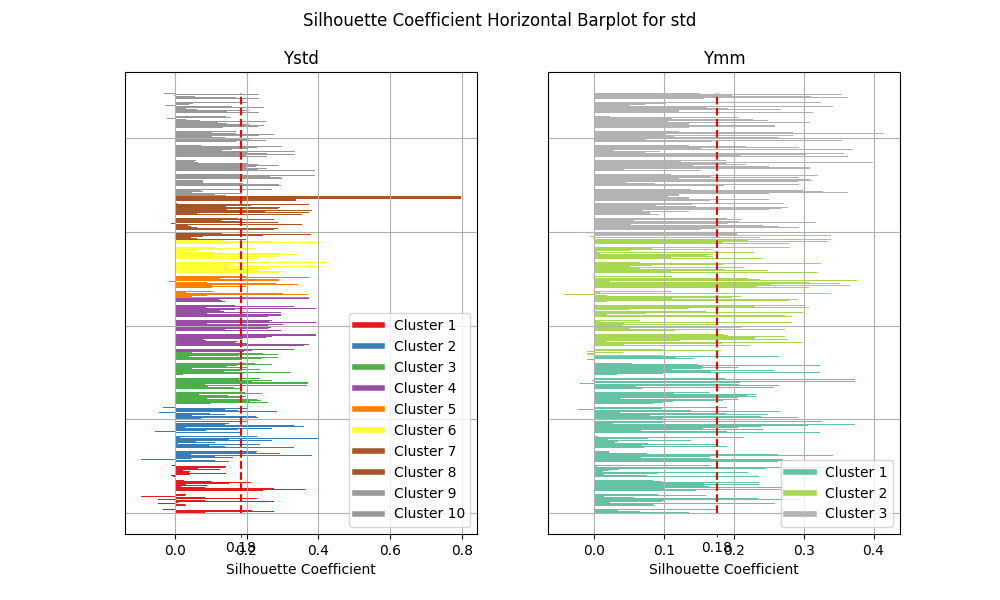

In [45]:
cmap_std = plt.cm.get_cmap('Set1',10)
cmap_mm = plt.cm.get_cmap('Set2',3)

color_to_clust_std = {clust: cmap_std(i) for i, clust in enumerate(sorted(pd.Series(clusters_Xstd).unique()))}
color_to_clust_mm = {clust: cmap_mm(i) for i, clust in enumerate(sorted(pd.Series(clusters_Xmm).unique()))}

legend_std = [Line2D([0], [0], color=color, lw=4) for color in color_to_clust_std.values()]
legend_mm = [Line2D([0], [0], color=color, lw=4) for color in color_to_clust_mm.values()]
barplot_df = pd.DataFrame({
    "std": val_sil_score,
    "mm": val_sil_score_mm,
    "cluster_std": clusters_Xstd,
    "cluster_mm": clusters_Xmm
}).sort_values(by="cluster_std")

fig, ax = plt.subplots(1, 2, figsize=(10, 6))
plot_barh(ax[0], barplot_df, "cluster_std", "std", color_to_clust_std, legend_std, "Ystd")
plot_barh(ax[1], barplot_df, "cluster_mm", "mm", color_to_clust_mm, legend_mm, "Ymm")
fig.suptitle("Silhouette Coefficient Horizontal Barplot for std")
plt.show()

As expected, the silhouette score of each cluster is near 0 which is means that a point belonging in a cluster is close to the confine of another cluster. It is shown this situation in the 3-Dimensional scatter plot with the contribute of just three PCs out of 5, and it was supposed that could be that first three principal component was not sufficient to clusterise points in labels, due to the fact that these hit just around 30% of the explained variance. Also, it was said that could be a possibility that the last two components (out of five) that were cutted out from the scatter plot, could be crucial to distinguish labels through data. Now, due to internal evaluation it is possible to say with certainty that this PCs are not able to distinguish well data, so clusters are continuously overlapping eachothers. Probably could be necessary to use a greater amount of PCs to understand better data and to clusterize them better.

Also, we can observe that some of scores are negative, which is meaning that clustering are not working as it should. Some factors could attack performance in K-meand and lead to almost 0 values in evaluation metrics. 
One of them could be surely a bad structure of dataset: to have good results appling this kind of algorithms (K-Means,PCA) it is necessary to earn good quality data.
The use of data and the resulting performance are highly dependent on the quality of the collected data and what it can explain. Therefore, the data collection phase is just as important as its management. In this dataset, the sampling process does not appear to be particularly efficient. If we wanted to extract useful insights for business marketing purposes, the questions asked should probably be different—more specifically tailored to the ultimate goal. While collecting such generic data provides a broader overview, it does not allow for a clear direction in guiding the work.